# 311 phone call of the city of Montreal

This is the code (and some change) done during the hackathon AI for Social Good. 

During the hackthon, we have analyse the 311 phone calls that the city of montreal reaceve. We have look at the data, given some visualisation of some quantities and then done a k-mean clustering to categorize the type of day in function of the different calls.

# Explanation of the data set

The data we used was given by the city of Montreal. It's consist of a csv file. Each row consist of citizen that try to contact the 311 service of the city of Montreal. This is many phone call, but that can include other way to contact the service like fax.

There are 2749419 row in the data set. For each of the row, we have 27 colunm that represent caracteristic about the call. For what we will do in this notebook, we will primaly look at 3 colunm : 

 - NATURE : very general category of the call
 - ACTI_NOM : sub-category of the call
 - DDS_DATE_CREATION : time of the call

# Exploration of the data

In [154]:
# look the data 
import pandas as pd
import numpy as np
from datetime import datetime
from matplotlib import pyplot as plt
import matplotlib
import seaborn as sns
import matplotlib.gridspec as gridspec
from sklearn.cluster import KMeans
%matplotlib inline

In [2]:
# let read the csv file
data = pd.read_csv('../3112017-05-30.csv')

C:\Users\Jules\AppData\Local\conda\conda\envs\nb36gp\lib\site-packages\IPython\core\interactiveshell.py:2728: DtypeWarning: Columns (0,3,4,5,6,8,9,10) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
# let us look to what the data frame look
data.head()

,ID_UNIQUE,NATURE,ACTI_NOM,TYPE_LIEU_INTERV,RUE,RUE_INTERSECTION1,RUE_INTERSECTION2,LOC_ERREUR_GDT,ARRONDISSEMENT,ARRONDISSEMENT_GEO,...,PROVENANCE_TELECOPIEUR,PROVENANCE_INSTANCE,PROVENANCE_MOBILE,PROVENANCE_MEDIASOCIAUX,PROVENANCE_SITEINTERNET,UNITE_RESP_PARENT,LOC_LONG,LOC_LAT,LOC_X,LOC_Y
0,NaN,Information,Débris sur la voie publique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,SEC.CENT.SERVICE.311,NaN,NaN,NaN,NaN
1,NaN,Information,Collecte des matières recyclables,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,LASALLE,NaN,NaN,NaN,NaN
2,NaN,Information,Collecte des matières recyclables,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,LASALLE,NaN,NaN,NaN,NaN
3,NaN,Information,Info-Remorquage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,LASALLE,NaN,NaN,NaN,NaN
4,NaN,Information,Bureau d'arrondissement - Service à la clientèle,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,LASALLE,NaN,NaN,NaN,NaN


Let us look somes caracteristics of the data

In [4]:
# We see that there are more than two million call(or other way)
nb_data = data.shape[0]
data.shape

(2749419, 27)

In [5]:
# the list of the column are
list(data)

['ID_UNIQUE',
 'NATURE',
 'ACTI_NOM',
 'TYPE_LIEU_INTERV',
 'RUE',
 'RUE_INTERSECTION1',
 'RUE_INTERSECTION2',
 'LOC_ERREUR_GDT',
 'ARRONDISSEMENT',
 'ARRONDISSEMENT_GEO',
 'LIN_CODE_POSTAL',
 'DDS_DATE_CREATION',
 'PROVENANCE_ORIGINALE',
 'PROVENANCE_TELEPHONE',
 'PROVENANCE_COURRIEL',
 'PROVENANCE_PERSONNE',
 'PROVENANCE_COURRIER',
 'PROVENANCE_TELECOPIEUR',
 'PROVENANCE_INSTANCE',
 'PROVENANCE_MOBILE',
 'PROVENANCE_MEDIASOCIAUX',
 'PROVENANCE_SITEINTERNET',
 'UNITE_RESP_PARENT',
 'LOC_LONG',
 'LOC_LAT',
 'LOC_X',
 'LOC_Y']

In [6]:
# Not every call have an ID
print('There is only',len(data['ID_UNIQUE'].dropna()),'unique ID')
print('That represent',len(data['ID_UNIQUE'].dropna())/nb_data,'% of the total data.')

There is only 1245764 unique ID
That represent 0.45310081875479874 % of the total data.


In [7]:
# number of nature of the call
numberNature = len(set(data['NATURE']))
numberNature

4

In [8]:
#The number of sub-category is
numberAct = len(set(data['ACTI_NOM']))
numberAct

1744

In [9]:
# all the row have a nature filled
len(data['NATURE'].dropna())/nb_data

1.0

In [10]:
# all the row have the activity filled
len(data['ACTI_NOM'].dropna())/nb_data

1.0

In [11]:
# about half have a type of place of intervention
len(data['TYPE_LIEU_INTERV'].dropna())/nb_data

0.453094271917085

In [12]:
# about one third have street name
len(data['RUE'].dropna())/nb_data

0.3688615667528303

In [13]:
# about 7% have the name the intersection street
len(data['RUE_INTERSECTION1'].dropna())/nb_data

0.07232582592904173

In [14]:
# about 7% have the name the second intersection street
len(data['RUE_INTERSECTION2'].dropna())/nb_data

0.0723250985026291

In [15]:
# about one third have postal code
len(data['LIN_CODE_POSTAL'].dropna())/nb_data

0.3436544229890024

In [16]:
# all of them have the time they were created
len(data['DDS_DATE_CREATION'].dropna())/nb_data

1.0

In [17]:
# about half have the arrondisement
len(data['ARRONDISSEMENT_GEO'].dropna())/nb_data

0.4529873402344277

In [18]:
# about half have longitude
len(data['LOC_LONG'].dropna())/nb_data

0.45301752843055204

In [19]:
# about half have lattitude
len(data['LOC_LAT'].dropna())/nb_data

0.45301752843055204

In [20]:
# almost all the data say how people contacted the service of 311
len(data['PROVENANCE_ORIGINALE'].dropna())/nb_data 

0.9992889406816494

### The data that have an ID

We see that there are many data that are not filled every time. The system probably change over time since not every row even have an ID. Let to look at the data that have ID

In [21]:
dataID = data[~data['ID_UNIQUE'].isnull()]
nb_dataID = dataID.shape[0]
nb_dataID

1245764

In [22]:
# almost all of them have the information of the type of place
len(dataID['TYPE_LIEU_INTERV'].dropna())/nb_dataID

0.9999855510353486

In [23]:
# about 80% have the street name information
len(dataID['RUE'].dropna())/nb_dataID

0.8140827636695233

In [24]:
# about one 75% have postal code
len(dataID['LIN_CODE_POSTAL'].dropna())/nb_dataID

0.7584502361603

In [25]:
# almost all have longitude
len(dataID['LOC_LONG'].dropna())/nb_dataID

0.9998161770608237

In [26]:
# about half have lattitude
len(dataID['LOC_LAT'].dropna())/nb_dataID

0.9998161770608237

### visualise a little more the data

In [27]:
# Let us look what Activity are more commun
# We see that the first thing that Montraler are preoccuped is permit for their animals.
dfCount=data[['NATURE','ACTI_NOM']].groupby(['ACTI_NOM']).count()
dfCount=dfCount.rename(columns={'NATURE': 'Nunber of time'})
dfCount=dfCount.sort_values('Nunber of time',ascending=False)

# calculate the percentage of occurence
dfCount['Poucentage d\'occurence'] =  dfCount['Nunber of time']/nb_data*100


dfCount.head(30)

,Nunber of time,Poucentage d'occurence
ACTI_NOM,,
Permis animalier,217628,7.915418
Taxes foncières,168820,6.140206
Collecte des encombrants,120614,4.386890
Collecte de déchets,107082,3.894714
Cour municipale,77362,2.813758
Collecte de branches d'arbre - Agrile du frêne,73896,2.687695
Permis - Divers,65059,2.366282
Eau - Divers,60356,2.195227
Bureau d'arrondissement - Service à la clientèle,56863,2.068182


In [28]:
# let us look the format of time
a = datetime.strptime('2014-03-03T04:06:07', '%Y-%m-%dT%H:%M:%S')
print('day : ',a.day)
print('month : ',a.month)
print('year : ',a.year)
print('hour : ',a.hour)
print('minute : ',a.minute)
print('second : ',a.second)
print('day of the week : ',a.weekday())
print('month string : ', a.strftime("%b"))

day :  3
month :  3
year :  2014
hour :  4
minute :  6
second :  7
day of the week :  0
month string :  Mar


In [29]:
data['DATE_TIME'] =  data['DDS_DATE_CREATION'].apply(lambda x: datetime.strptime(x, '%Y-%m-%dT%H:%M:%S'))

In [30]:
# let create column for the year,month,day,hour
data['year'] =  data['DATE_TIME'].apply(lambda x: x.year)
data['month'] =  data['DATE_TIME'].apply(lambda x: x.month)
data['day'] =  data['DATE_TIME'].apply(lambda x: x.day)
data['hour'] =  data['DATE_TIME'].apply(lambda x: x.hour)
data['day_week'] = data['DATE_TIME'].apply(lambda x: x.weekday())

In [31]:
#Let us look the number of month to be sure that the first data was the month and not the day
len(set(data['month']))

12

In [32]:
#Let us look the number of day to be sure that the first data was the month and not the month
len(set(data['day']))

31

In [33]:
# let us make dictionary for the month and the day of the week
MonthDic = {1:'january',2:'febuary',3:'mars',4:'april',5:'may',6:'june',7:'july',8:'august',9:'september',10:'october',11:'november',12:'december'}
DayDic = {0:'monday',1:'thusday',2:'wednesday',3:'thursday',4:'friday',5:'saturday',6:'sunday'}

In [34]:
# what are the different number of nature of call
set(data['NATURE'])

{'Commentaire', 'Information', 'Plainte', 'Requete'}

In [35]:
# let us look the activity that are more commun among each of Nature(i.e. big category)
data[data['NATURE']=='Plainte'].ACTI_NOM.value_counts().sort_values(ascending=False).head(20)

Opération déneigement                2188
Collecte de déchets                  1417
Collecte des matières recyclables     725
Environnement - Divers                651
Voirie - Divers                       622
Neige - Divers                        622
Balai mécanique                       349
Eau - Divers                          328
Collecte de résidus alimentaires      310
Sports et loisirs - Installations     299
Élagage                               282
Maires et élus d'arrondissement       280
Collecte de résidus verts             279
Services Techniques - Varia           275
Permis - Divers                       254
Retour DDS                            246
Info-travaux - Arrondissement         242
Personnel - Arrondissement            219
Dépôt illégal - Déchets               215
Nid-de-poule                          211
Name: ACTI_NOM, dtype: int64

In [36]:
data[data['NATURE']=='Requete'].ACTI_NOM.value_counts().sort_values(ascending=False).head(20)

Permis animalier                                  142104
Collecte de branches d'arbre - Agrile du frêne     61686
Collecte des encombrants                           47513
Éclairage existant - Entretien                     35468
Collecte de déchets                                34994
Dépôt illégal - Déchets                            34255
Feux de circulation - Entretien                    25694
Nid-de-poule                                       24817
Élagage                                            21465
Fermeture d'entrée d'eau                           21168
Collecte des matières recyclables                  20803
Voirie - Divers                                    20496
Graffitis - Domaine privé                          20018
Encaissement - Oasis                               19538
Puisard                                            17418
Eau - Divers                                       16432
Encaissement - Stop +                              16112
Changement d'adresse - Taxes fo

In [37]:
data[data['NATURE']=='Information'].ACTI_NOM.value_counts().sort_values(ascending=False).head(20)

Taxes foncières                                     164861
Cour municipale                                      77022
Permis animalier                                     75472
Collecte des encombrants                             72905
Collecte de déchets                                  70230
Permis - Divers                                      56867
Bureau d'arrondissement - Service à la clientèle     55686
Eau - Divers                                         43471
SRRR                                                 34003
Organisme divers                                     27738
Collecte de résidus verts                            27088
Collecte des matières recyclables                    24497
Intervention stationnement                           24489
Écocentre                                            20448
Sports et loisirs - Activités                        19904
Permis - Construction                                18580
Contrôle animalier                                   177

In [38]:
data[data['NATURE']=='Commentaire'].ACTI_NOM.value_counts().sort_values(ascending=False).head(20)

Opération déneigement                   1316
Neige - Divers                           443
Collecte de déchets                      441
Collecte des matières recyclables        254
Maires et élus d'arrondissement          248
Collecte de résidus alimentaires         238
Voirie - Divers                          211
Signalisation - Circulation - Études     185
Contrôle animalier                       160
Sports et loisirs - Installations        156
Retour DDS                               156
Balai mécanique                          146
Parc - Divers                            130
Eau - Divers                             125
Services Techniques - Varia              114
SRRR                                     112
Collecte de résidus verts                109
Environnement - Divers                   107
Signalisation - Neige                    106
Trottoir glissant                         90
Name: ACTI_NOM, dtype: int64

Plaint are maybe more important to the city to know since it's related to the fact the their citizen are not happy. So we will look at them in more detail. But we have to remember that represent only a small fraction of the total call. Request and information are by far the most commun call. The number of complaint for the highest number one(i.e. deneigement) is 10 smaller than about the 10th most important reason of call for information of request.

In [39]:
# Let us create a list of serie that contain the count of plain for each month
# we keep the month =0 which is nothing to make easier
listPlaintMonth = [(data[(data['NATURE']=='Plainte') & (data['month']==i)]['ACTI_NOM'].value_counts().sort_values(ascending=False)) for i in range(13)]


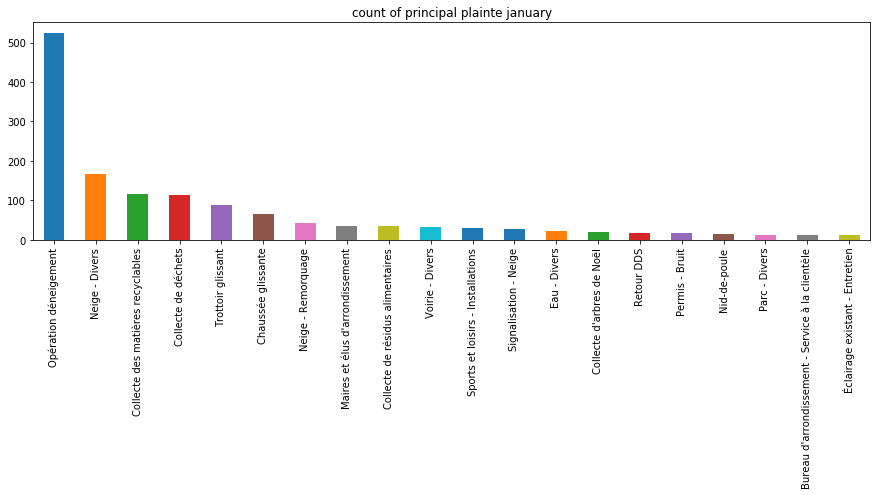

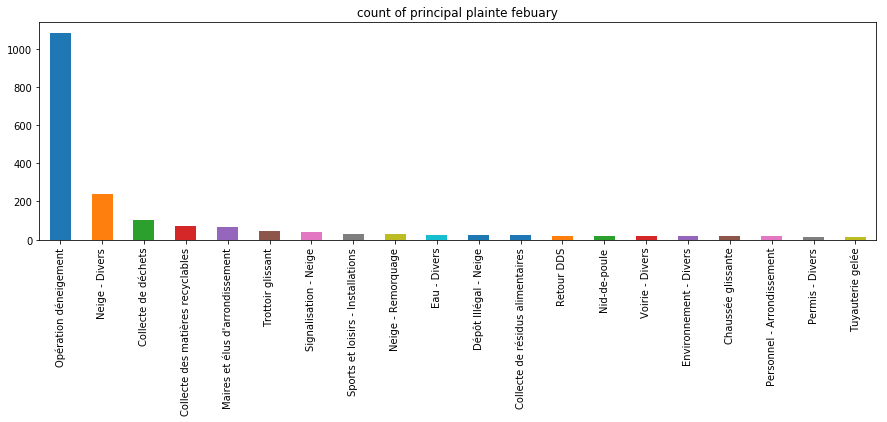

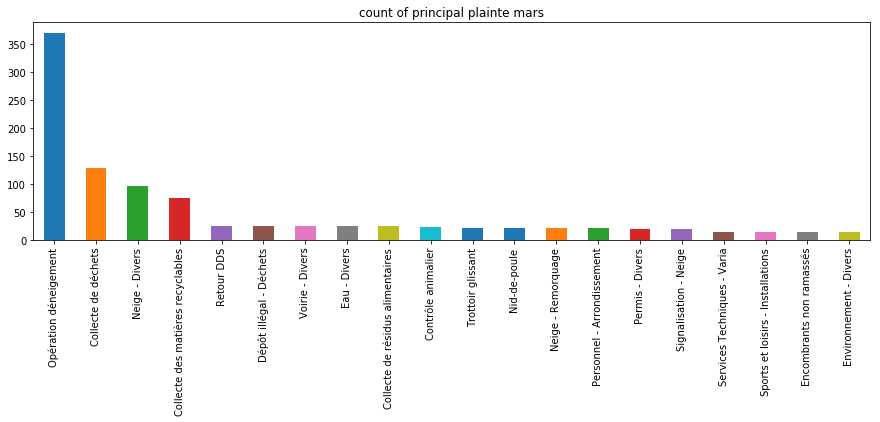

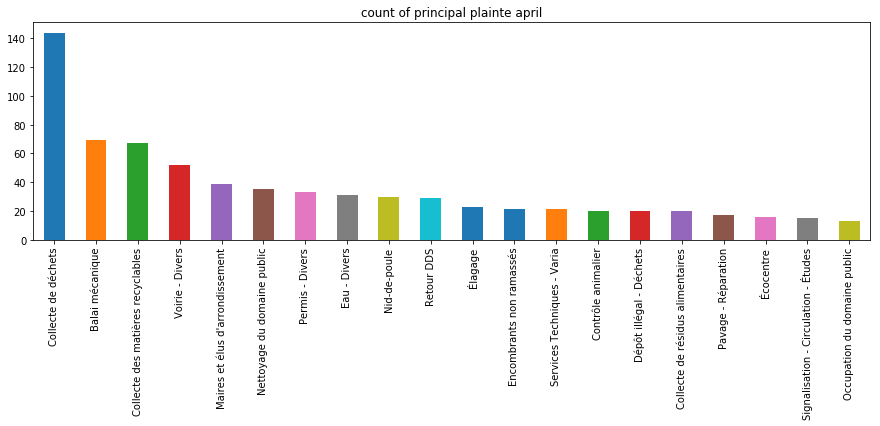

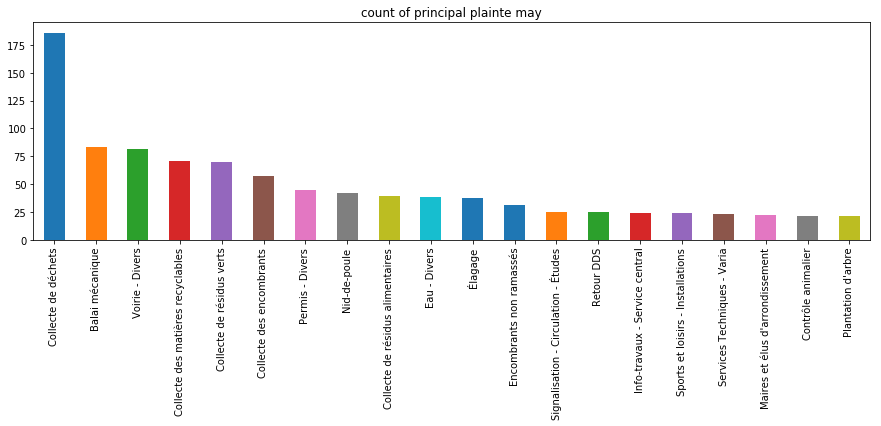

...

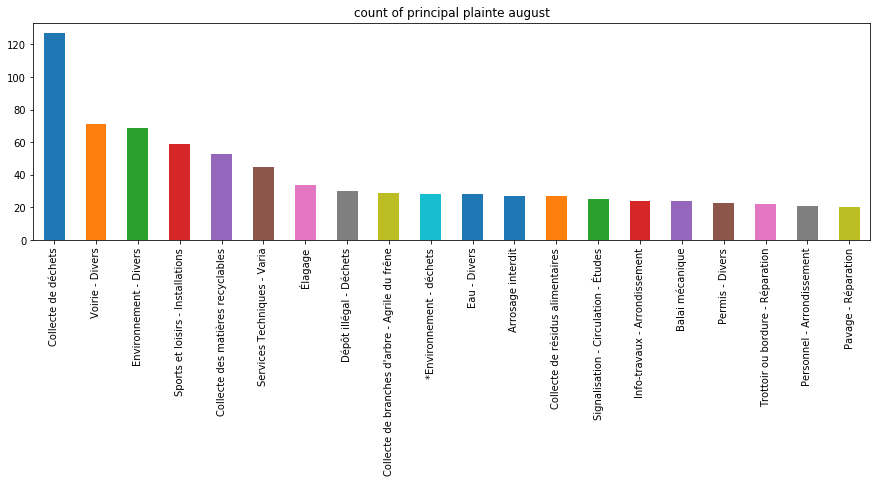

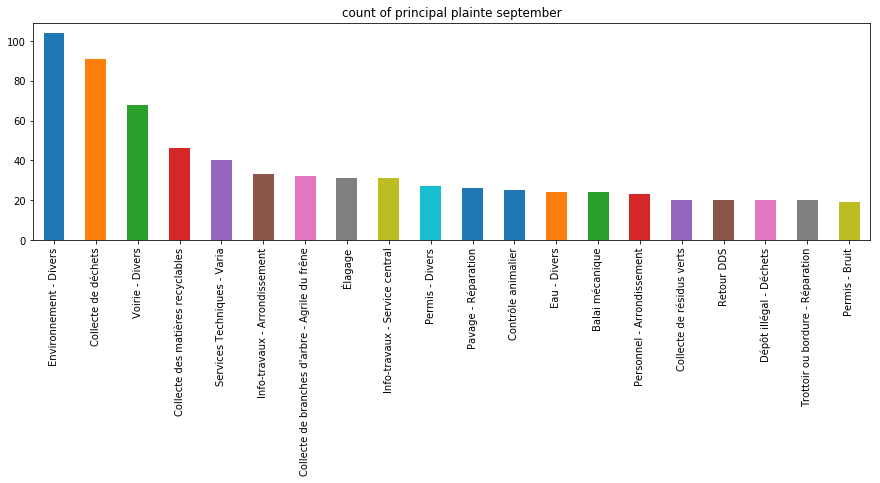

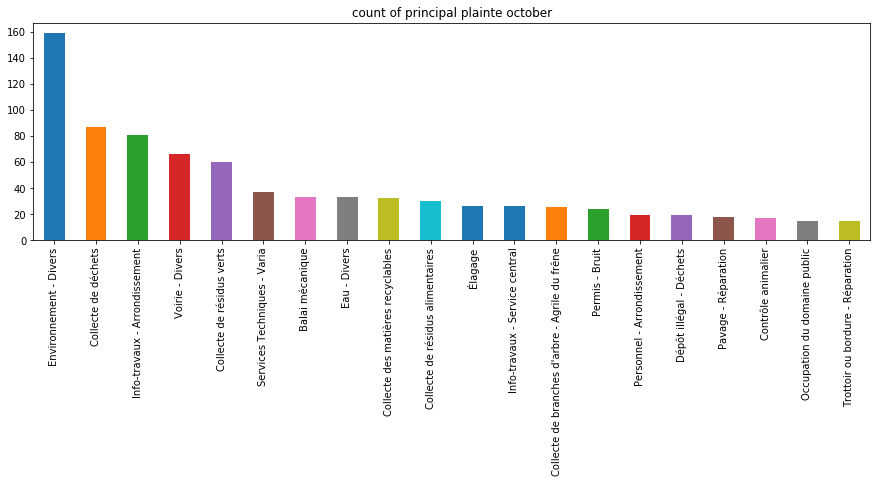

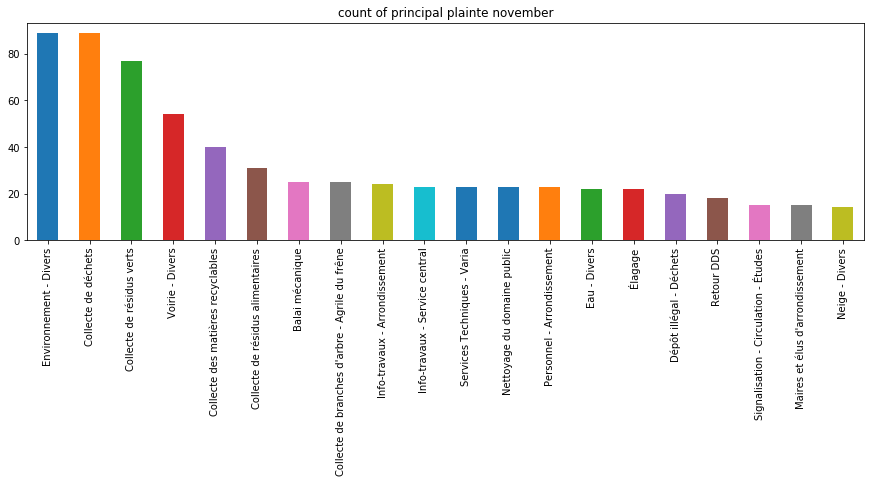

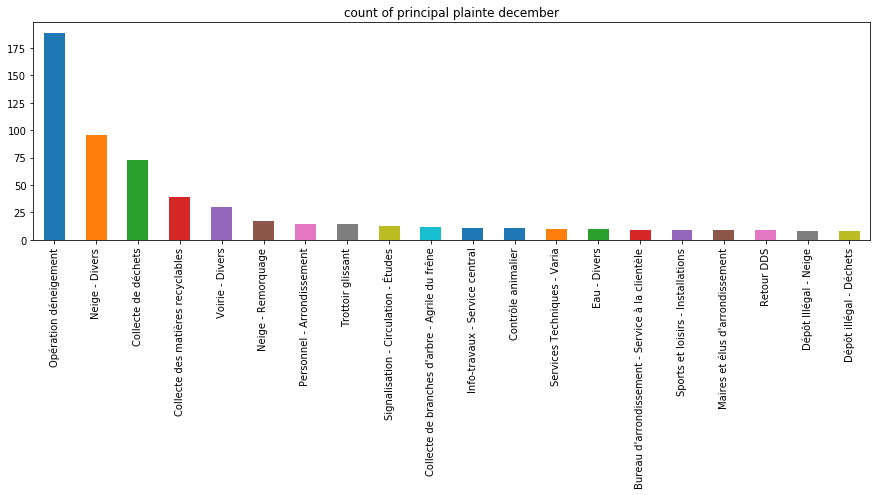

In [40]:
# Let us look the histogram of the most commun plaint that people do each month
for i in range(1,13):
    listPlaintMonth[i][:20].plot(kind='bar',figsize=(15, 4)).set_title('count of principal plainte '+MonthDic[i])
    plt.show()

We see that in the winter snow is a big part of plaint while in the summer garbage became the most important topic.

To go a little more in detail, we see that in winter, there one big outlier that is "Opération déneigement". It is by farm the biggest in the month of December,January, Febuary, Mars. But that not only related to snow and ice, we that there also "Neige - Divers", "Trottoir glissant", "Chaussée glissante", "Neige - Remorquage", "Signalisation - Neige".

We see that in the summer garbage as "Collecte des déchets" is the most commun one. But we see that there less a peak in the complaint for garbage as snow in the winter. We can also put some other compaint in the same kind of category as garbage as we did for snow. There could be "Collecte des matières recyclables", "Dépôt illégal - Déchets","*Environnement - déchets", "Collecte de résidus alimentaires".

We could check the pourcentage of these two categories at each month. 

In [42]:
listSnow = ['Opération déneigement','Neige - Divers','Trottoir glissant','Chaussée glissante','Neige - Remorquage','Signalisation - Neige']
listGarbage = ['Collecte des déchets','Collecte des matières recyclables','Dépôt illégal - Déchets','*Environnement - déchets','Collecte de résidus alimentaires']

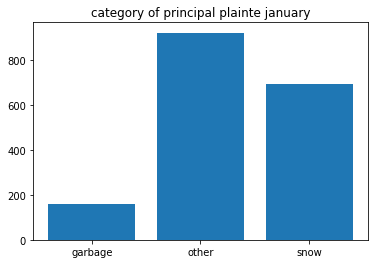

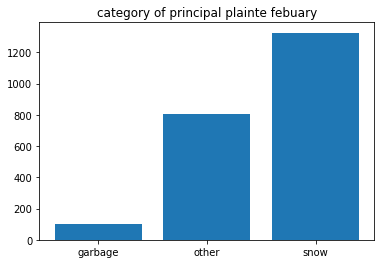

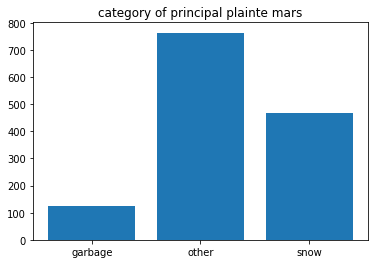

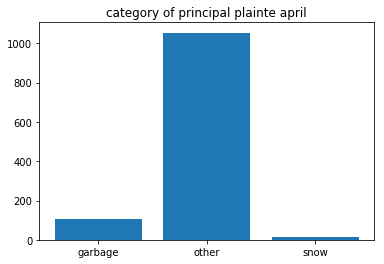

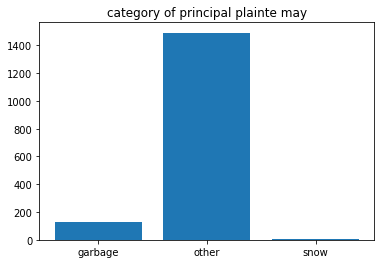

...

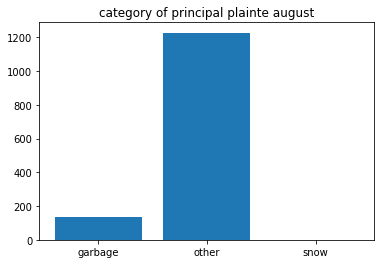

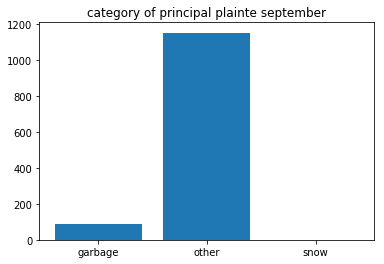

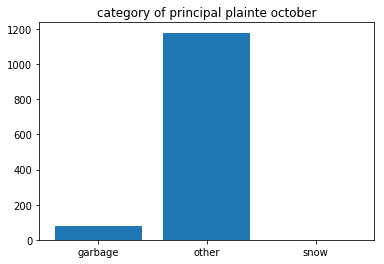

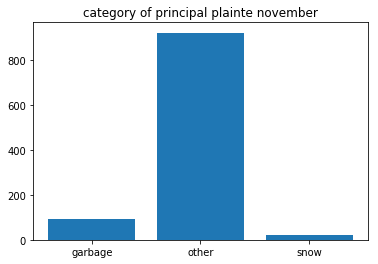

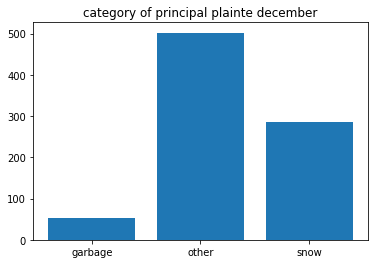

In [63]:
# let us create a bar plot that show all these complaint for each month
for i in range(1,13):
    ComplaintPerMonth = data[(data['NATURE']=='Plainte') & (data['month']==i)]['ACTI_NOM'].value_counts().sum()
    ComplaintSnowPerMonth = data[(data['NATURE']=='Plainte') & (data['month']==i) & (data['ACTI_NOM'].isin(listSnow))]['ACTI_NOM'].value_counts().sum()
    ComplaintGarbagePerMonth = data[(data['NATURE']=='Plainte') & (data['month']==i) & (data['ACTI_NOM'].isin(listGarbage))]['ACTI_NOM'].value_counts().sum()

    plt.bar(['snow','garbage','other'],[ComplaintSnowPerMonth,ComplaintGarbagePerMonth,ComplaintPerMonth-ComplaintSnowPerMonth-ComplaintGarbagePerMonth])
    plt.title('category of principal plainte '+MonthDic[i])
    plt.show()

In [66]:
# we can try to see better with stacket-bar plot

#first let create the data for the plot

ListCountSnow = []
ListCountGarbage = []
ListOther = []
ListMonth = []

for i in range(1,13):
    
    ComplaintPerMonth = data[(data['NATURE']=='Plainte') & (data['month']==i)]['ACTI_NOM'].value_counts().sum()
    ComplaintSnowPerMonth = data[(data['NATURE']=='Plainte') & (data['month']==i) & (data['ACTI_NOM'].isin(listSnow))]['ACTI_NOM'].value_counts().sum()
    ComplaintGarbagePerMonth = data[(data['NATURE']=='Plainte') & (data['month']==i) & (data['ACTI_NOM'].isin(listGarbage))]['ACTI_NOM'].value_counts().sum()
    
    ListCountSnow.append(ComplaintSnowPerMonth)
    ListCountGarbage.append(ComplaintGarbagePerMonth)
    ListOther.append(ComplaintPerMonth-ComplaintSnowPerMonth-ComplaintGarbagePerMonth)
    ListMonth.append(i)
    

In [ ]:
# now we can create this plot

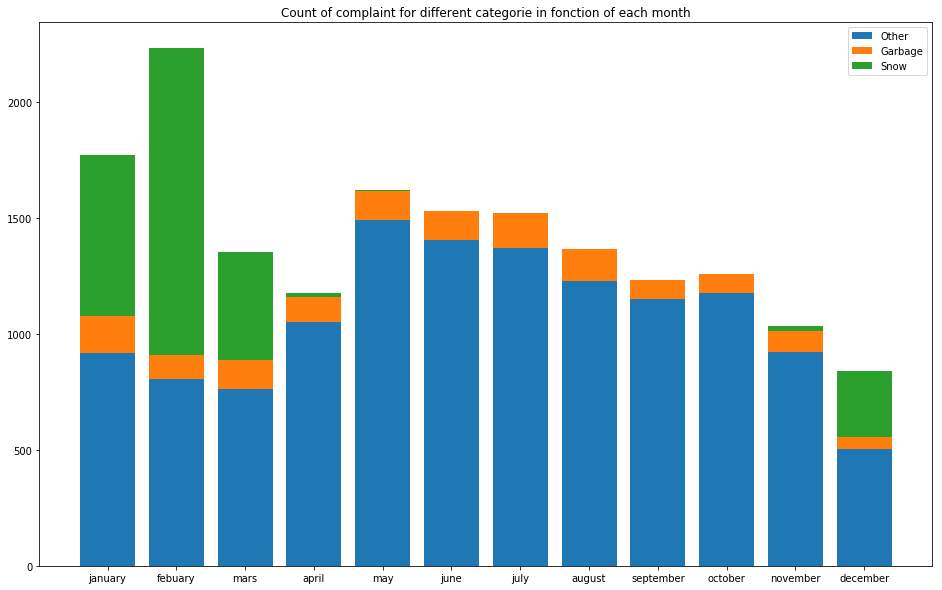

In [101]:
plt.bar(ListMonth,ListOther)
plt.bar(ListMonth,ListCountGarbage,bottom=ListOther)
ListSumOtherGarbage = [sum(i) for i in zip(ListOther,ListCountGarbage)]
plt.bar(ListMonth,ListCountSnow,bottom=ListSumOtherGarbage)
plt.title('Count of complaint for different categorie in fonction of each month')
ListMonthName = [MonthDic[i] for i in ListMonth]
plt.xticks(ListMonth, ListMonthName)
plt.rcParams["figure.figsize"] = [16,10]
plt.legend(('Other', 'Garbage','Snow'))

In [41]:
# let us do a list of serie of plaint for each day of the week
listPlaintDay = [(data[(data['NATURE']=='Plainte') & (data['day_week']==i)]['ACTI_NOM'].value_counts().sort_values(ascending=False)) for i in range(7)]

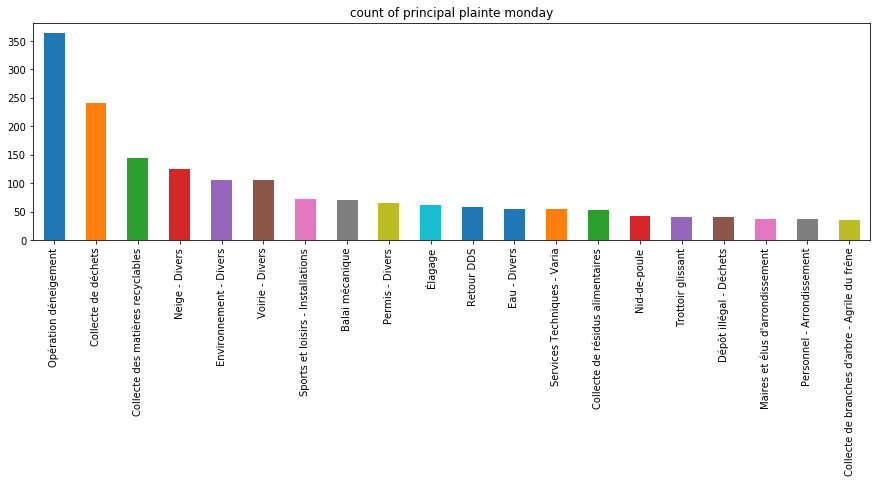

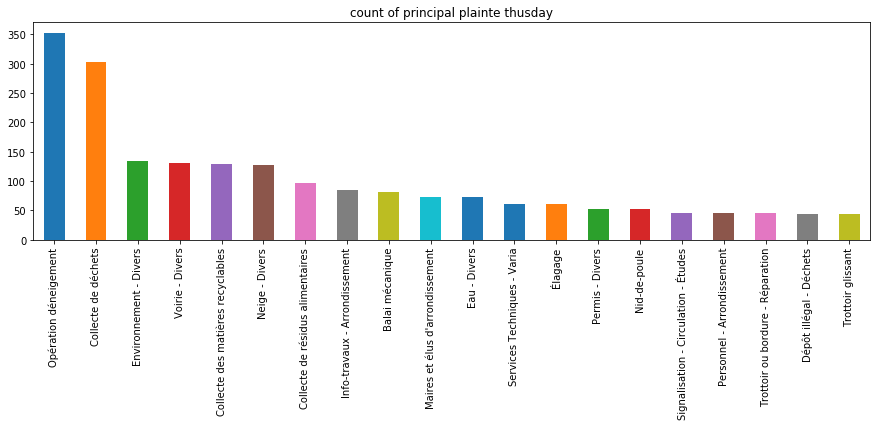

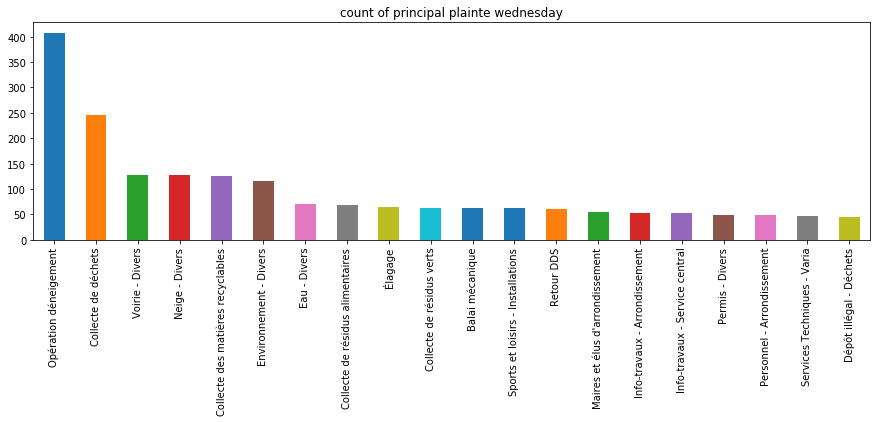

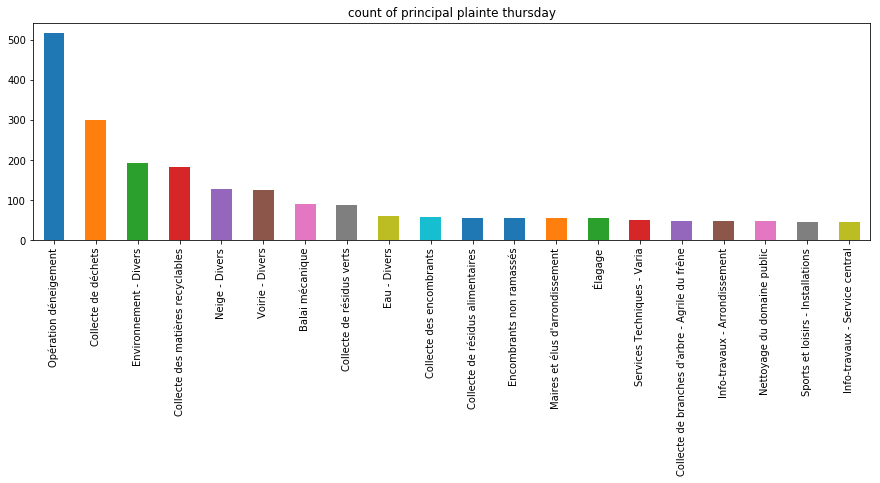

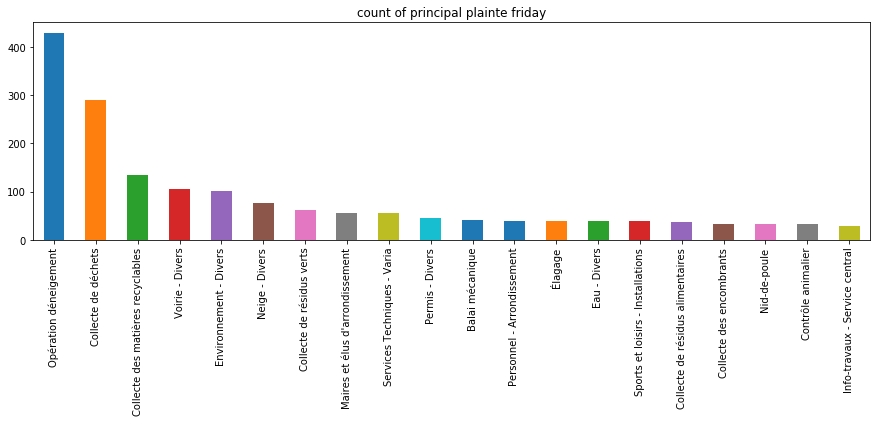

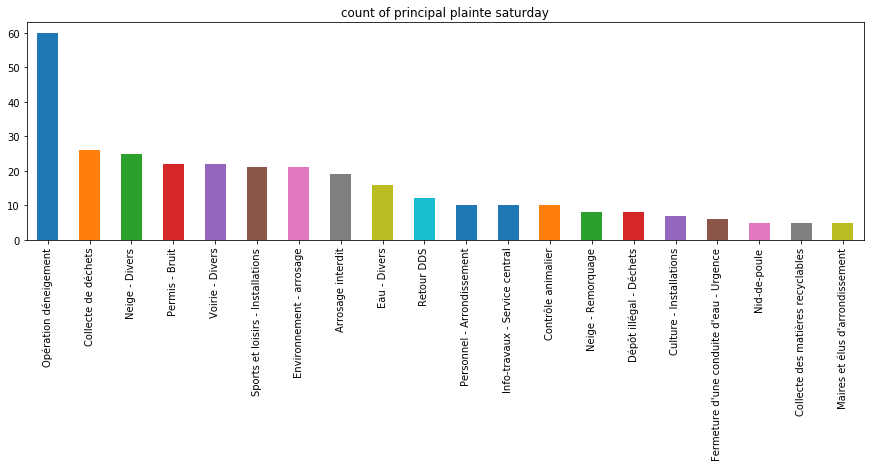

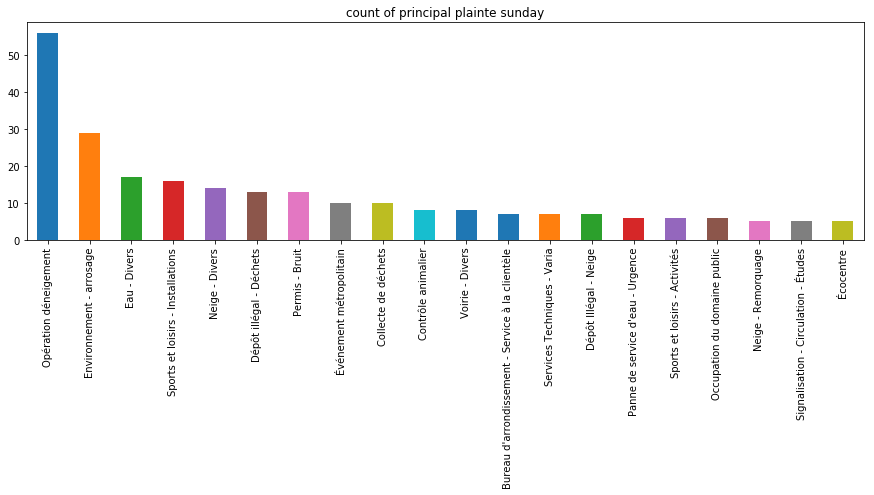

In [42]:
# Let us look the histogram of the most commun plaint that people do each day of the week
for i in range(7):
    listPlaintDay[i][:20].plot(kind='bar',figsize=(15, 4)).set_title('count of principal plainte '+DayDic[i])
    plt.show()

It's seem that there not that much difference between the day of the week.

Now that we have see what kind of plaint montrealer are doing more for each month and for each day of the week, we can fo the inverse and look how some plaint vary in time in function of the month.

First thing is to create a list of the most commun plaint we will treat.

In [102]:
# let us create a list of the 50 most commun plaint sorted by number of time they appear
ListCommunPlaint = list(data[(data['NATURE']=='Plainte') ]['ACTI_NOM'].value_counts().sort_values(ascending=False).index[:50])

In [103]:
# color map for the next series of graph we will do
my_cmap = matplotlib.cm.get_cmap('rainbow')

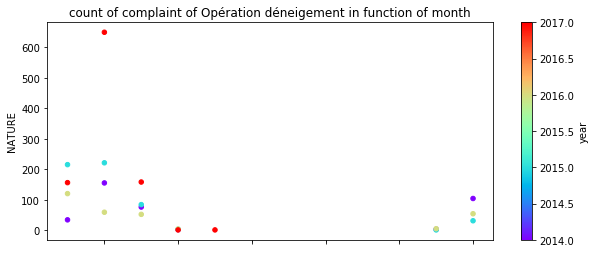

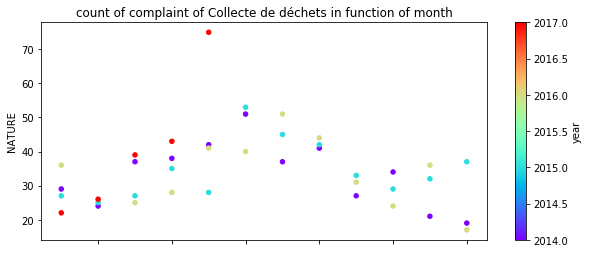

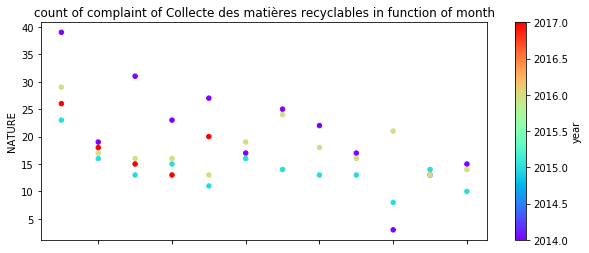

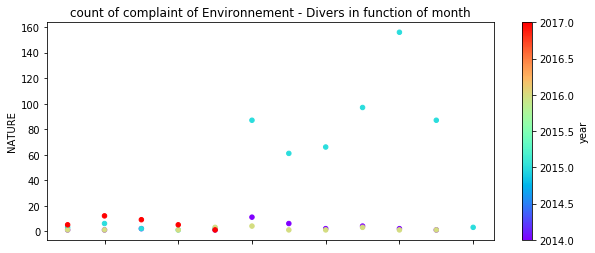

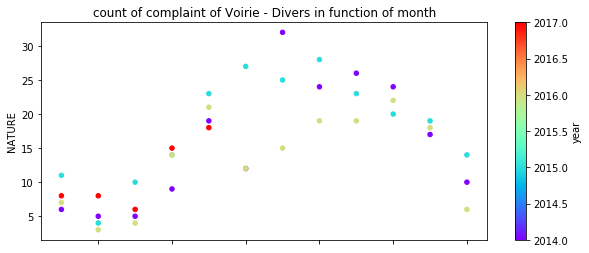

...

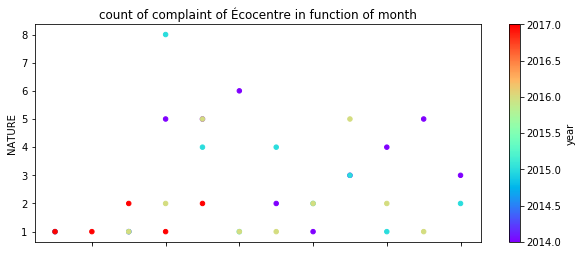

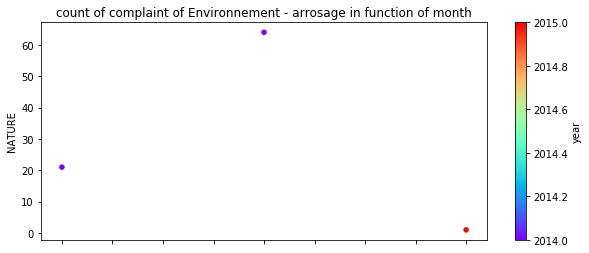

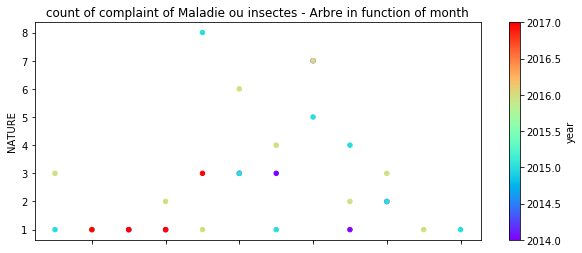

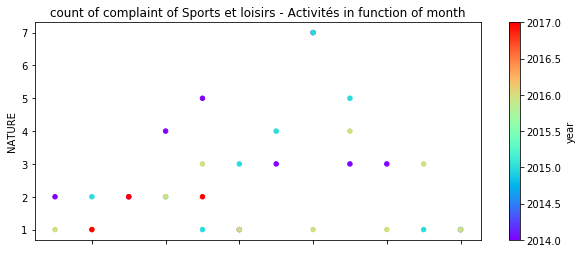

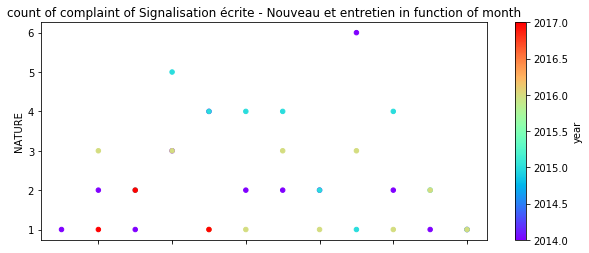

In [104]:
for i in ListCommunPlaint:
    data[(data['ACTI_NOM']==i) & (data['NATURE']=='Plainte')].groupby(['year','month']).count().reset_index().plot.scatter(y='NATURE', x='month', c='year', cmap=my_cmap,figsize=(10, 4)).set_title('count of complaint of '+i+' in function of month')
    plt.show()

We can also look by the time of the week if there are some more interesting patern to see.

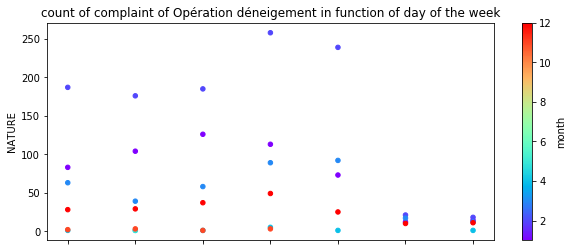

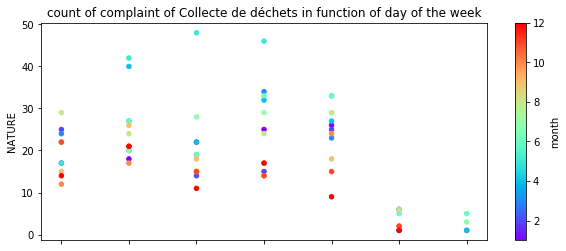

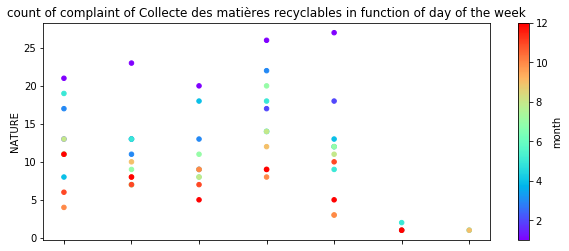

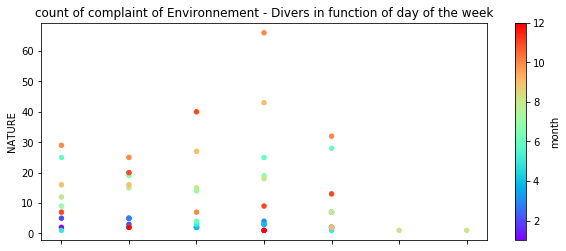

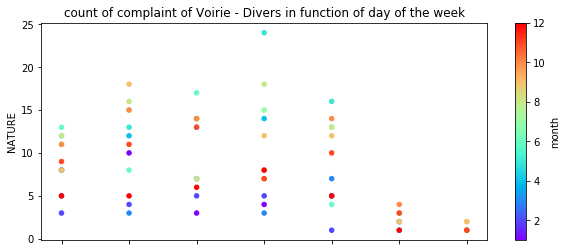

...

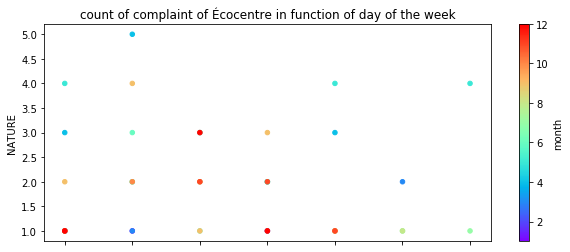

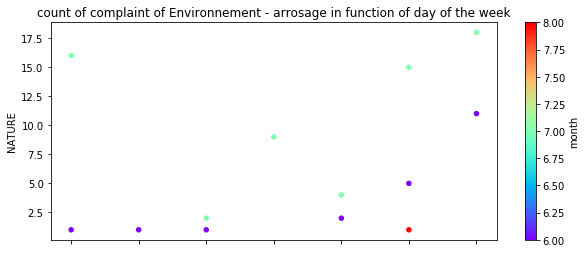

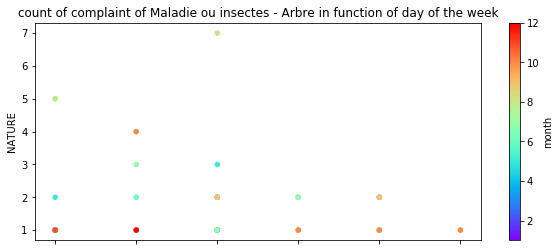

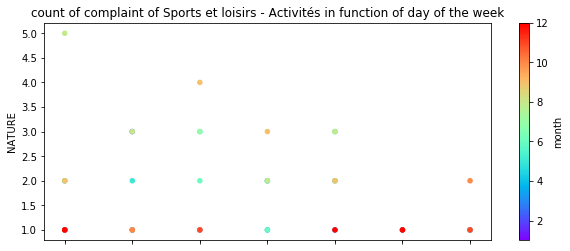

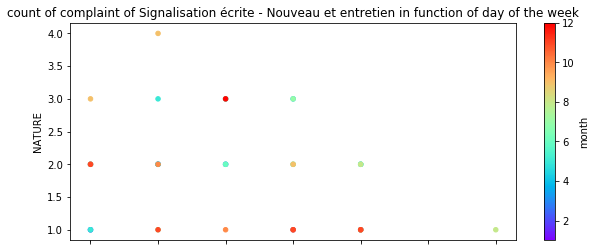

In [105]:
for i in ListCommunPlaint:
    data[(data['ACTI_NOM']==i) & (data['NATURE']=='Plainte')].groupby(['day_week','month']).count().reset_index().plot.scatter(y='NATURE', x='day_week', c='month', cmap=my_cmap,figsize=(10, 4)).set_title('count of complaint of '+i+' in function of day of the week')
    plt.show()

Complaint represent a small fraction of the total data. So let us look how this translate into for all the call.

In [106]:
# let just for fun look the same kind of graph for all the call, not only for complaint
ListCommun = list(data['ACTI_NOM'].value_counts().sort_values(ascending=False).index[:100])

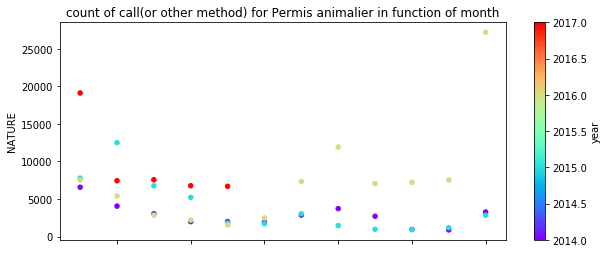

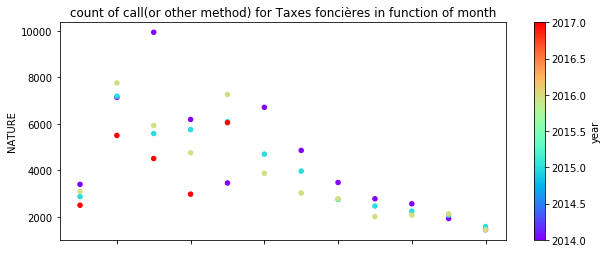

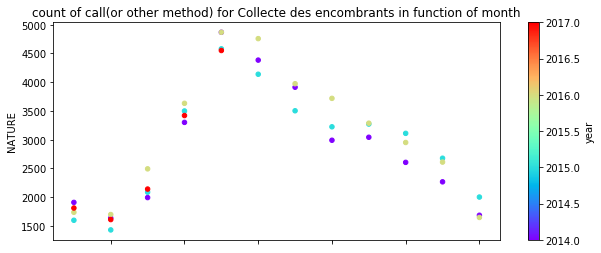

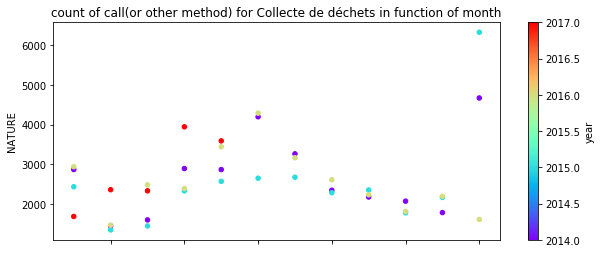

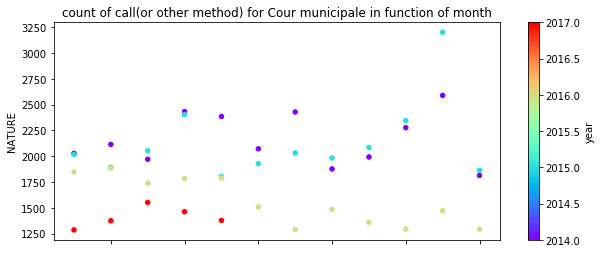

...

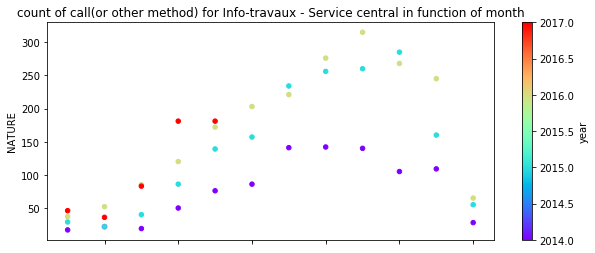

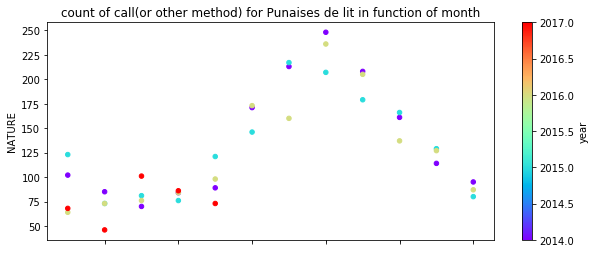

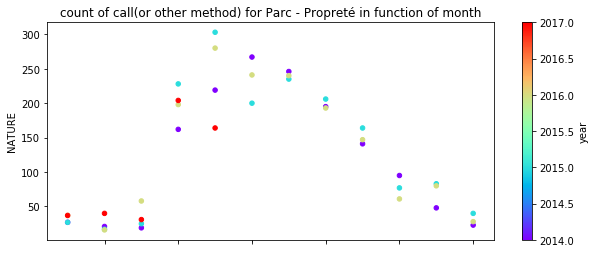

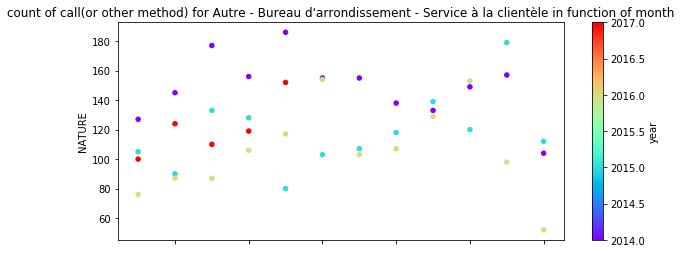

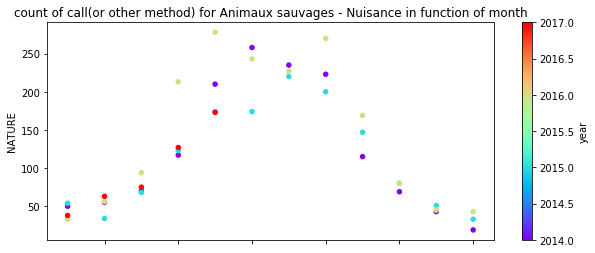

In [107]:
for i in ListCommun:
    data[(data['ACTI_NOM']==i) ].groupby(['year','month']).count().reset_index().plot.scatter(y='NATURE', x='month', c='year', cmap=my_cmap,figsize=(10, 4)).set_title('count of call(or other method) for '+i+' in function of month')
    plt.show()

Let us again look for the day of the week

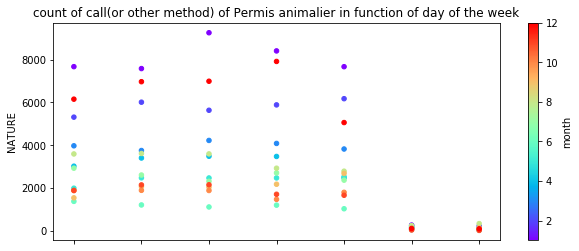

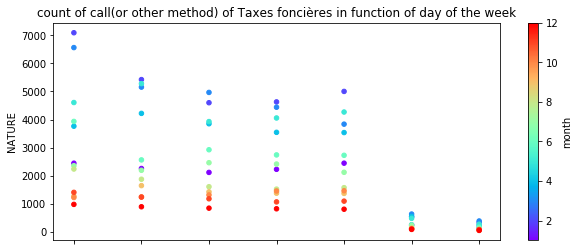

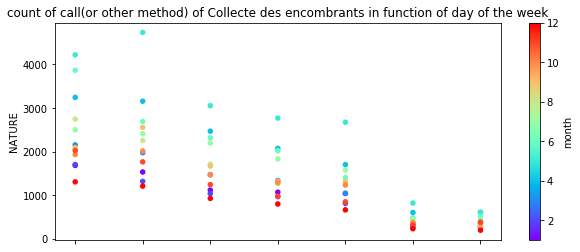

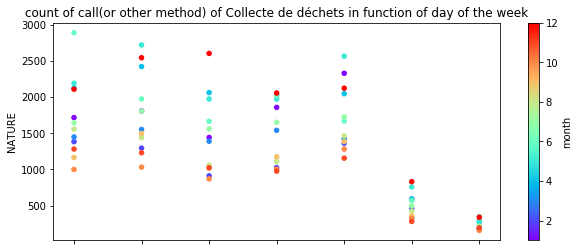

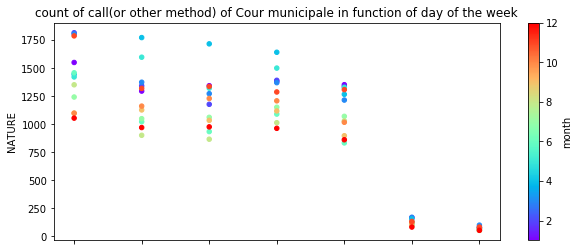

...

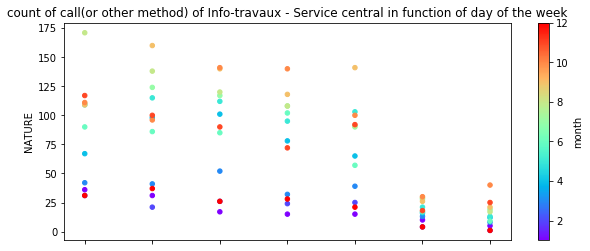

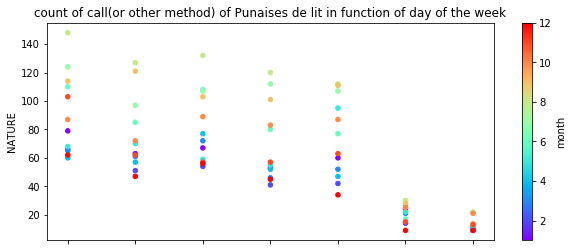

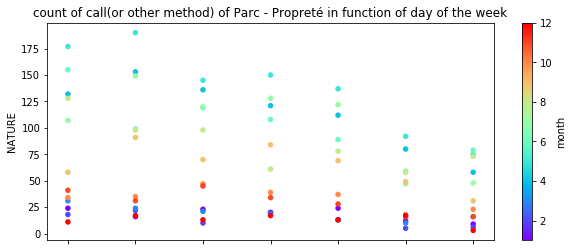

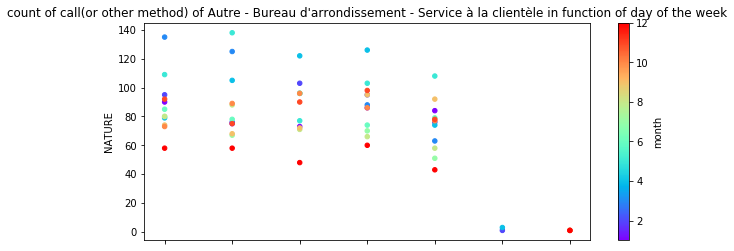

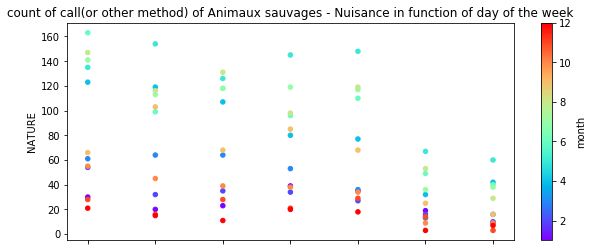

In [61]:
for i in ListCommun:
    data[(data['ACTI_NOM']==i) ].groupby(['day_week','month']).count().reset_index().plot.scatter(y='NATURE', x='day_week', c='month', cmap=my_cmap,figsize=(10, 4)).set_title('count of call(or other method) of '+i+' in function of day of the week')
    plt.show()

Let us try to gain more insight on the data by counting the number of call for each subcategory (i.e. nature) per unique month(i.e. mars 2016 and mars 2015 are not the same month). There might have too much category, so we will look only on the most 100 commun one.

The first thing is to create the set of activity we will look.

Then for each of these activities, we need to group by years and month(so that we group by unique). Then we count the call.

In [108]:
#most important activity name 
Set_Acti_nom=set(dfCount.reset_index()['ACTI_NOM'][:100])

In [110]:
dataCountmonth=pd.DataFrame()# create a dataframe where we will put these values
# loop over the principal subcategory
for Name_id in Set_Acti_nom:
    dataTest = data[(data['ACTI_NOM']==Name_id) ].groupby(['year','month']).count()# count the number of activity per month
    dataCountmonth[Name_id]=dataTest['NATURE'] # put inside the dataframe the value

# reset the index so that year and month are column and not index
dataCountmonth=dataCountmonth.reset_index()
dataCountmonth=dataCountmonth.fillna(0)# fill by 0 if no value

In [113]:
# let us see what kind of dataframe this give us
dataCountmonth.head(10)

,year,month,Fermeture d'une conduite d'eau - Urgence,Distribution de sacs,Tuyauterie gelée,Personnel - Arrondissement,Encaissement - Oasis,Terrain insalubre - Domaine privé,Subvention - Habitation,Graffitis - Domaine privé,...,Punaises de lit,Sports et loisirs - Installations,Maires et élus d'arrondissement,Écocentre,Élagage,Urbanisme,Info-travaux - Arrondissement,Autre - Bureau d'arrondissement - Service à la clientèle,Collecte de résidus alimentaires,Signalisation écrite - Nouveau et entretien
0,2014,1,317,0.0,589.0,173,94,88,396,209,...,102,810,230,377,102,142,58,127,136,259
1,2014,2,214,0.0,387.0,229,129,42,375,78,...,85,527,293,272,128,230,40,145,87,221
2,2014,3,237,0.0,237.0,228,918,85,404,82,...,70,499,167,362,202,271,56,177,128,387
3,2014,4,253,100.0,10.0,267,821,429,454,682,...,84,409,264,680,494,306,114,156,187,733
4,2014,5,241,374.0,1.0,244,837,509,491,626,...,89,654,296,1013,848,333,254,186,199,458
5,2014,6,285,77.0,1.0,223,832,381,365,720,...,171,932,239,947,1551,319,295,155,313,454
6,2014,7,341,119.0,0.0,212,664,455,347,825,...,213,671,251,842,1677,321,380,155,355,425
7,2014,8,298,89.0,0.0,144,318,296,201,688,...,248,899,151,723,1198,199,289,138,223,312
8,2014,9,382,262.0,0.0,187,344,223,349,656,...,208,385,212,633,1197,311,249,133,315,429
9,2014,10,440,1455.0,0.0,222,226,113,350,478,...,161,219,206,598,756,285,431,149,416,389


In [114]:
# let us save this file in case we would have for other thing 
dataCountmonth.to_csv('dataCountmonth.csv')

Now let see what we can gain insignt from this. Let us do a heatmap of the correlation we have between each of the activity.

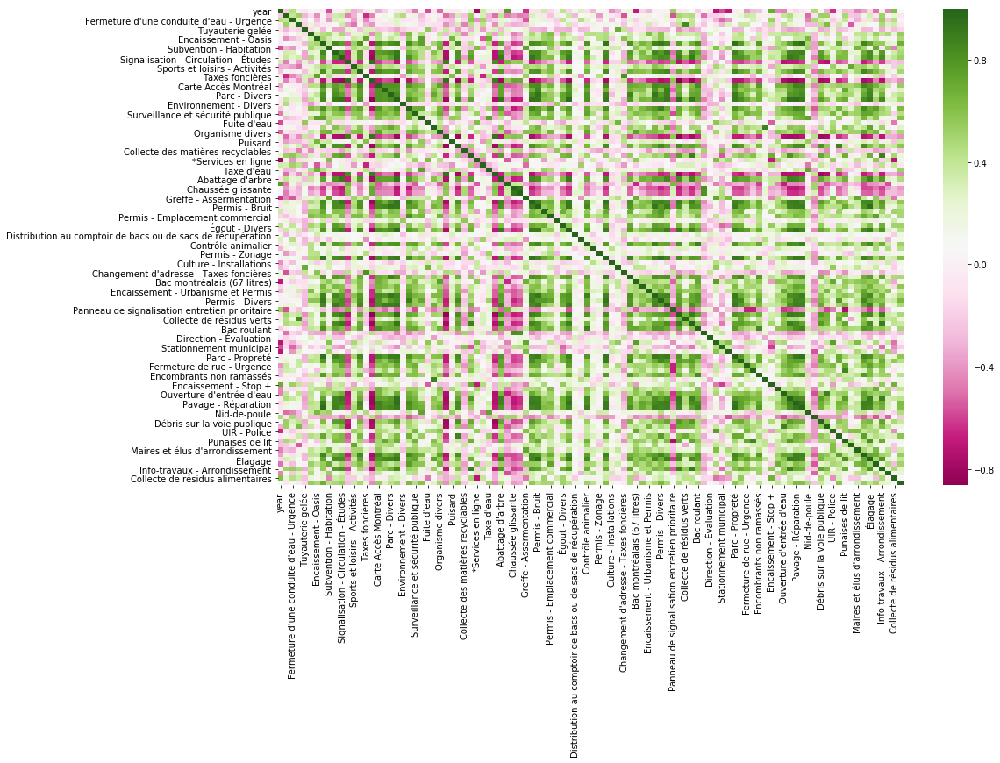

In [115]:
# as we can see there too much data to see anything
dataCountmonthCorr=dataCountmonth.corr()
sns.heatmap(dataCountmonthCorr,cmap="PiYG")

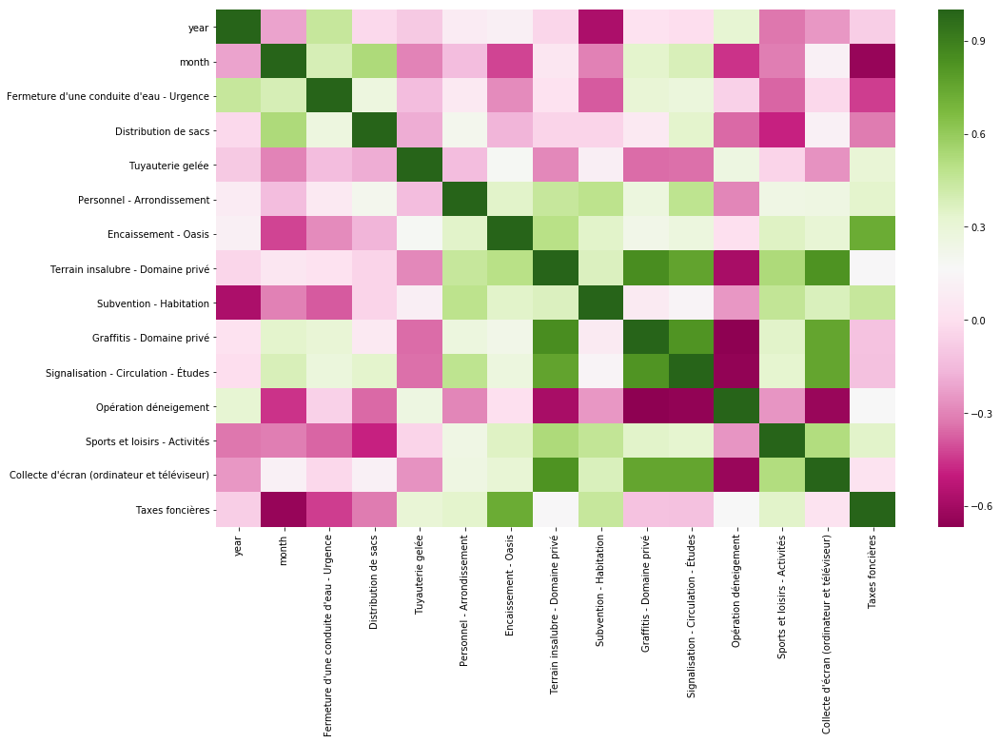

In [116]:
# we could do the correlation of only the most important terms. But then, maybe we don't see other correlation with others activities.
dataCountmonthCorrSmall=dataCountmonth.iloc[:,:15].corr()
sns.heatmap(dataCountmonthCorrSmall,cmap="PiYG")

So what we will do instead, is to look for each subcategory what are the thing that are the most corrolated

In [117]:
# we will choose to look only to the activities that have important number of call
Set_Acti_nom_Very_impo=list(dfCount.reset_index()['ACTI_NOM'][:20])
Set_Acti_nom_Very_impo

['Permis animalier',
 'Taxes foncières',
 'Collecte des encombrants',
 'Collecte de déchets',
 'Cour municipale',
 "Collecte de branches d'arbre - Agrile du frêne",
 'Permis - Divers',
 'Eau - Divers',
 "Bureau d'arrondissement - Service à la clientèle",
 'Collecte des matières recyclables',
 'Éclairage existant - Entretien',
 'Dépôt illégal - Déchets',
 'SRRR',
 "Fermeture d'entrée d'eau",
 'Collecte de résidus verts',
 'Nid-de-poule',
 'Voirie - Divers',
 'Feux de circulation - Entretien',
 'Opération déneigement',
 'Élagage']

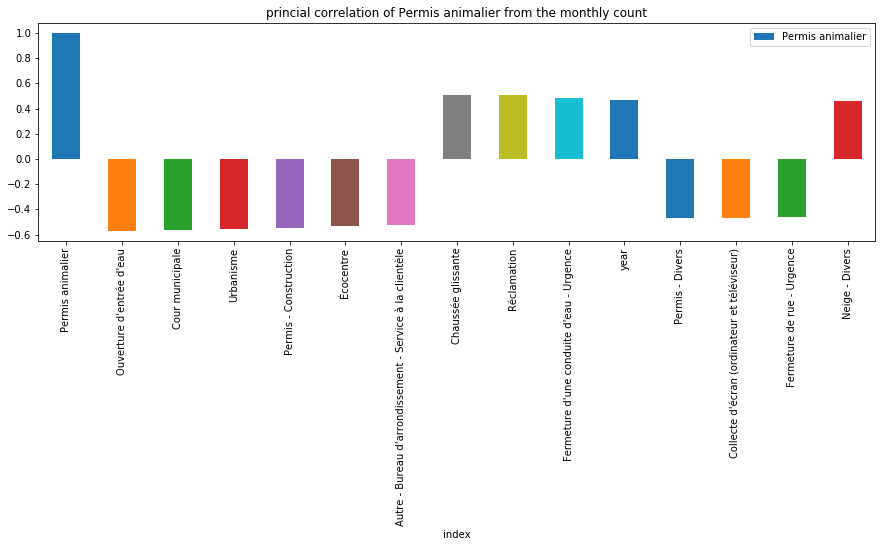

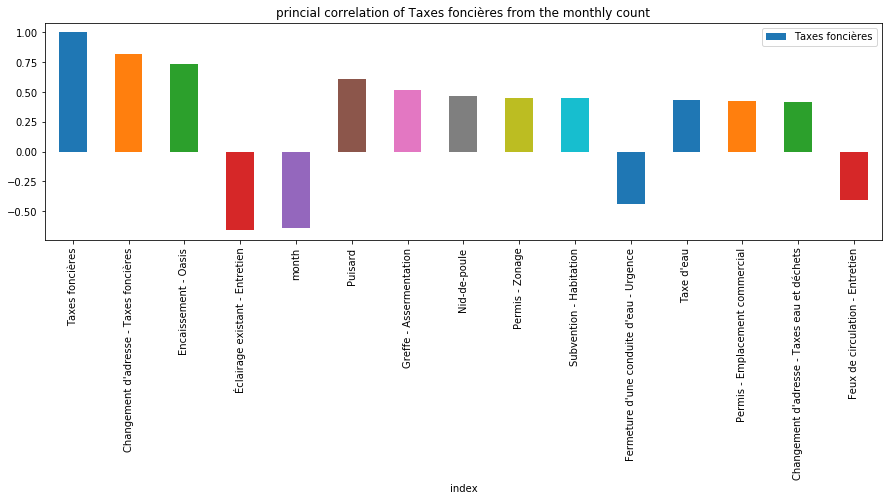

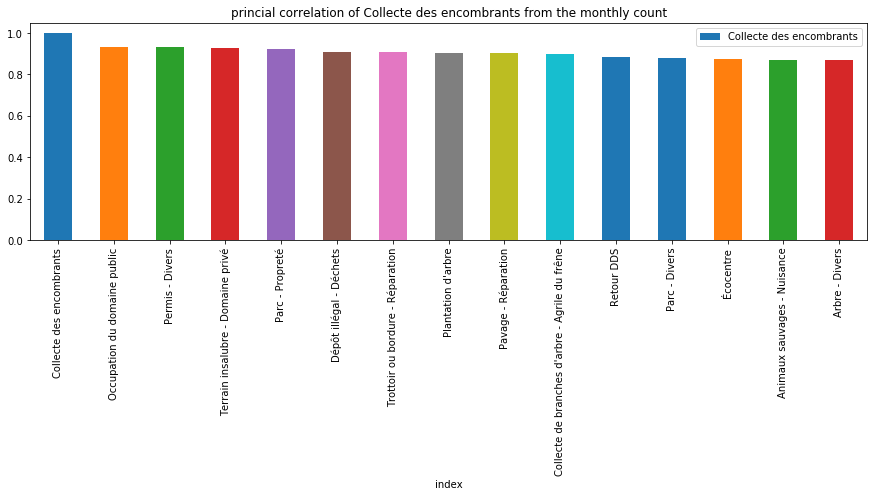

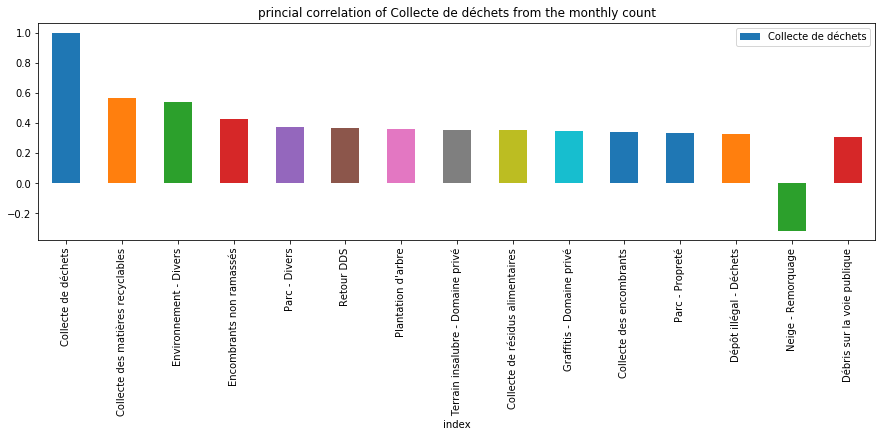

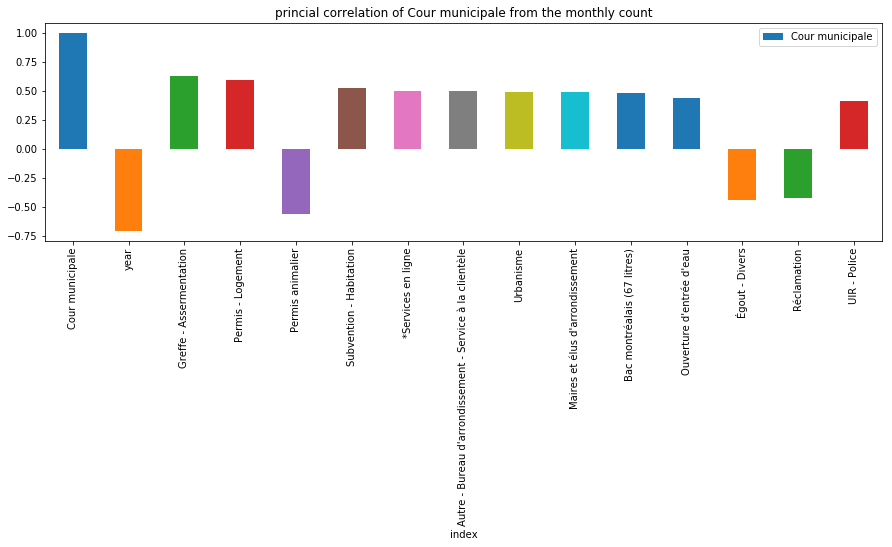

...

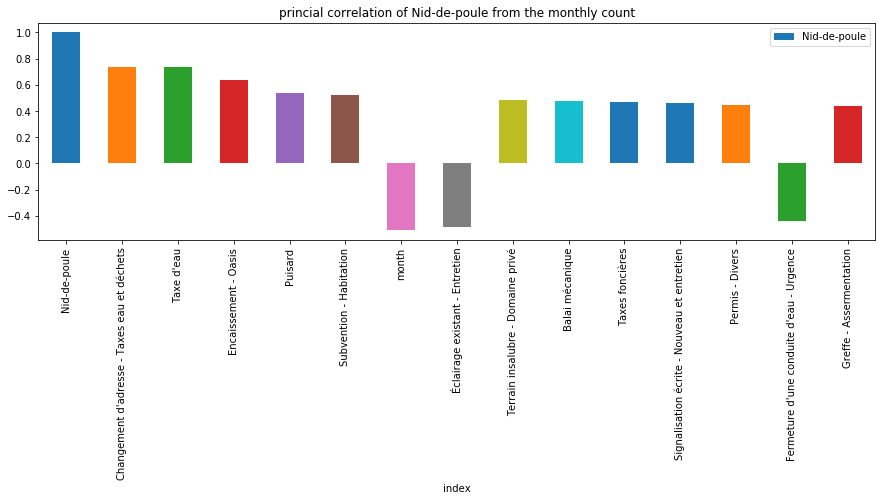

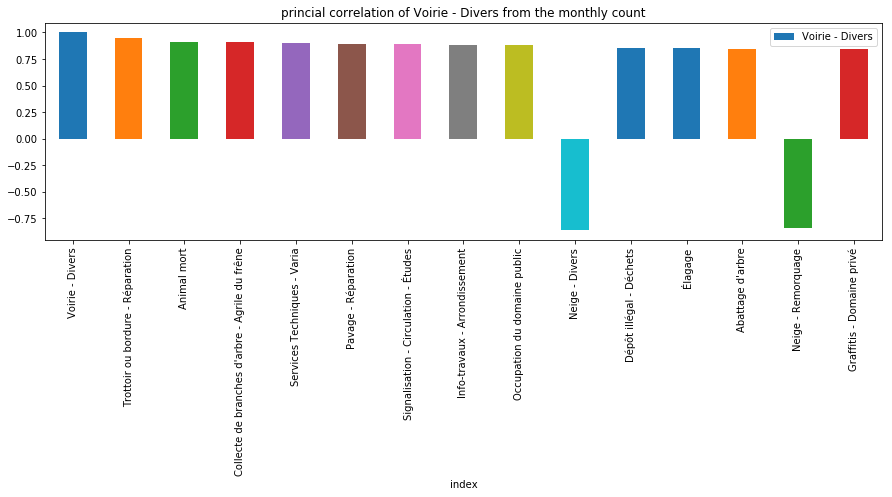

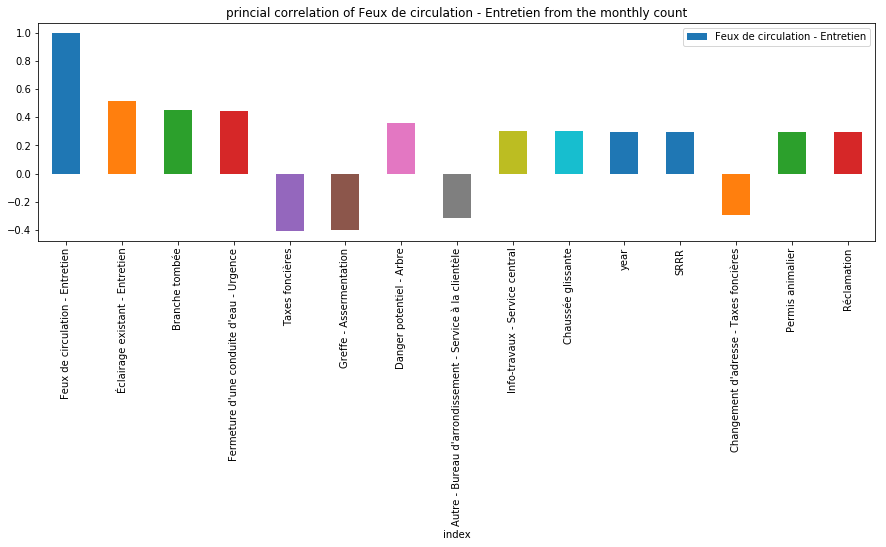

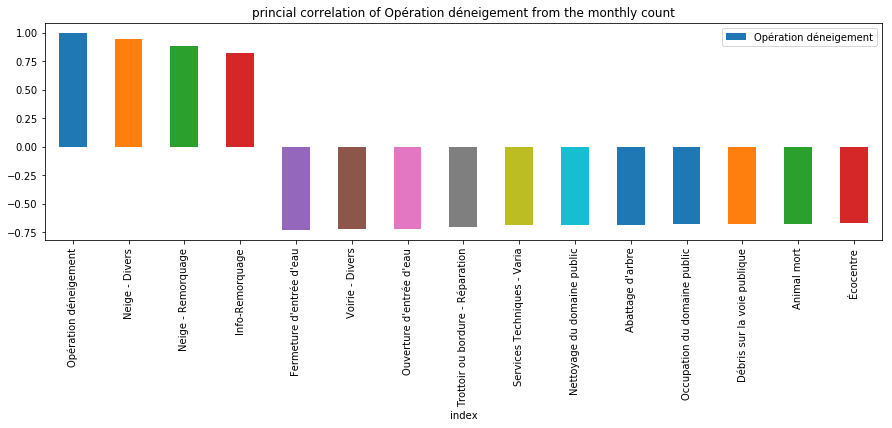

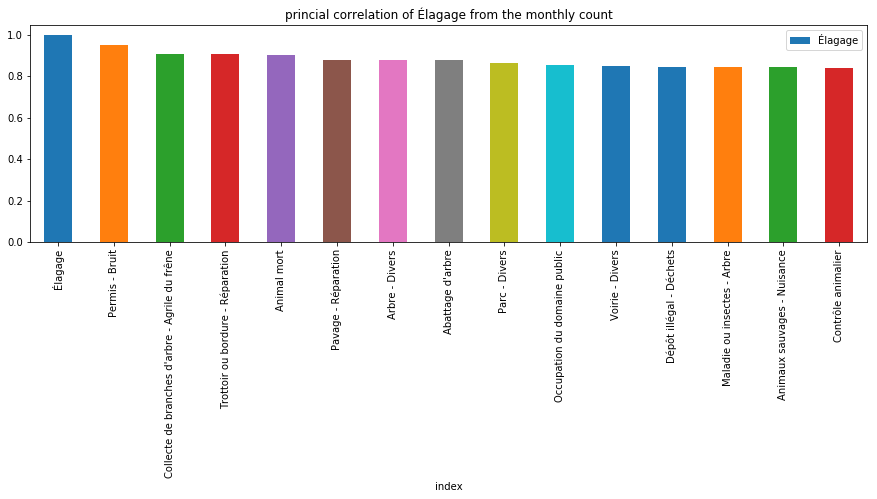

In [120]:
for NameVariable in Set_Acti_nom_Very_impo:

    # we want to sort this in function of the absolute value of the correlation, because negative correlation would still give us important information
    
    # we first create a new column that consist of the absolution value of the correlation for the data frame of correlation
    dataCountmonthCorr['sort'] = dataCountmonthCorr[NameVariable].abs()
   
    # sort the value in function of the absolution value of the correlation
    finalDf =dataCountmonthCorr.sort_values('sort',ascending=False)
    # remove the sort column we used to calulate the absolute value of the correlation
    finalDf = finalDf.drop('sort', axis=1)
    
    # reset the index so that the index column can be used to have the variable the correlation are linked to
    finalDf=finalDf.reset_index()
    
    # we keep index(which is the name of the variable corrolated to NameVariable)
    # the NameVariable column is the value of the correlation
    # we keep only the 15 more important correlation
    finalDf=finalDf[['index',NameVariable]][:15]
    
    (finalDf.plot(x='index',y=NameVariable, kind='bar',figsize=(15, 4)).set_title('princial correlation of '+ NameVariable + ' from the monthly count'))
    plt.show()

We might want a more fine grain description in function of time. So instead of looking at each month, we can look at each day. We maybe there would be some correlation that are linked to the day of the week that could in theory campture using day time step.

In [126]:
dataCountday=pd.DataFrame()
for Name_id in Set_Acti_nom:
    dataTest=0
    dataTest=pd.DataFrame()
    dataTest = data[(data['ACTI_NOM']==Name_id) ].groupby(['year','month','day','day_week']).count()
    dataCountday[Name_id]=dataTest['NATURE']

In [127]:
dataCountday=dataCountday.reset_index()
dataCountday=dataCountday.fillna(0)
dataCountday.head(10)

,year,month,day,day_week,Fermeture d'une conduite d'eau - Urgence,Distribution de sacs,Tuyauterie gelée,Personnel - Arrondissement,Encaissement - Oasis,Terrain insalubre - Domaine privé,...,Punaises de lit,Sports et loisirs - Installations,Maires et élus d'arrondissement,Écocentre,Élagage,Urbanisme,Info-travaux - Arrondissement,Autre - Bureau d'arrondissement - Service à la clientèle,Collecte de résidus alimentaires,Signalisation écrite - Nouveau et entretien
0,2014,1,1,2,1,0.0,3.0,2.0,0.0,0.0,...,0.0,34.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0
1,2014,1,2,3,15,0.0,88.0,4.0,0.0,2.0,...,0.0,16.0,4.0,35.0,2.0,0.0,0.0,0.0,4.0,3.0
2,2014,1,3,4,4,0.0,152.0,6.0,12.0,1.0,...,1.0,34.0,6.0,18.0,0.0,3.0,3.0,4.0,3.0,2.0
3,2014,1,4,5,2,0.0,91.0,0.0,0.0,0.0,...,2.0,48.0,0.0,14.0,0.0,0.0,1.0,0.0,1.0,4.0
4,2014,1,5,6,4,0.0,28.0,0.0,0.0,1.0,...,2.0,44.0,0.0,3.0,2.0,0.0,2.0,0.0,0.0,7.0
5,2014,1,6,0,13,0.0,16.0,7.0,7.0,4.0,...,5.0,21.0,9.0,14.0,7.0,3.0,4.0,13.0,10.0,6.0
6,2014,1,7,1,22,0.0,14.0,8.0,1.0,4.0,...,3.0,19.0,9.0,16.0,0.0,5.0,1.0,9.0,5.0,18.0
7,2014,1,8,2,8,0.0,8.0,11.0,6.0,5.0,...,1.0,16.0,12.0,14.0,9.0,5.0,1.0,5.0,5.0,5.0
8,2014,1,9,3,10,0.0,1.0,14.0,4.0,7.0,...,4.0,21.0,17.0,13.0,5.0,5.0,6.0,16.0,3.0,5.0
9,2014,1,10,4,16,0.0,3.0,8.0,3.0,6.0,...,8.0,24.0,12.0,7.0,3.0,6.0,6.0,4.0,1.0,19.0


In [128]:
# Let us save it, if we want to use it later
dataCountday.to_csv('dataCountday.csv')

In [129]:
# we can look the coorelation as we did before
dataCountdayCorr=dataCountday.corr()
dataCountdayCorr

,year,month,day,day_week,Fermeture d'une conduite d'eau - Urgence,Distribution de sacs,Tuyauterie gelée,Personnel - Arrondissement,Encaissement - Oasis,Terrain insalubre - Domaine privé,...,Punaises de lit,Sports et loisirs - Installations,Maires et élus d'arrondissement,Écocentre,Élagage,Urbanisme,Info-travaux - Arrondissement,Autre - Bureau d'arrondissement - Service à la clientèle,Collecte de résidus alimentaires,Signalisation écrite - Nouveau et entretien
year,1.000000,-0.209121,-0.005847,0.000129,0.174879,-0.015599,-0.060021,0.025047,0.046744,-0.022284,...,-0.136576,-0.132259,-0.140046,-0.260661,-0.097680,-0.158549,0.081439,-0.104863,0.420617,0.021742
month,-0.209121,1.000000,0.007256,0.003676,0.133932,0.313793,-0.200770,-0.046431,-0.170491,0.021624,...,0.231569,-0.128601,-0.089205,0.122563,0.209043,-0.037565,0.294467,0.018942,0.152539,-0.035262
day,-0.005847,0.007256,1.000000,0.003314,0.020919,-0.029276,-0.026614,-0.010163,-0.013039,-0.024442,...,-0.005606,0.037108,-0.040379,0.007680,0.004005,-0.014430,0.018327,-0.041121,-0.046576,-0.007307
day_week,0.000129,0.003676,0.003314,1.000000,-0.244576,-0.237338,-0.014676,-0.618070,-0.329531,-0.452241,...,-0.464624,-0.204376,-0.555881,-0.233643,-0.472259,-0.652355,-0.420495,-0.538031,-0.411921,-0.503266
Fermeture d'une conduite d'eau - Urgence,0.174879,0.133932,0.020919,-0.244576,1.000000,0.145045,0.011806,0.233183,0.057996,0.153561,...,0.210949,0.022997,0.176015,0.001719,0.234773,0.147200,0.264898,0.131510,0.252273,0.143912
Distribution de sacs,-0.015599,0.313793,-0.029276,-0.237338,0.145045,1.000000,-0.076188,0.272450,0.075805,0.117640,...,0.204390,-0.121089,0.204649,0.162979,0.198587,0.230887,0.382562,0.272156,0.343490,0.145378
Tuyauterie gelée,-0.060021,-0.200770,-0.026614,-0.014676,0.011806,-0.076188,1.000000,-0.010275,0.200390,-0.127428,...,-0.079700,-0.017529,0.055889,-0.146255,-0.128918,0.020629,-0.136111,0.014340,-0.117387,-0.046300
Personnel - Arrondissement,0.025047,-0.046431,-0.010163,-0.618070,0.233183,0.272450,-0.010275,1.000000,0.339777,0.497912,...,0.433351,0.119930,0.611166,0.228768,0.475870,0.662886,0.452483,0.597898,0.412914,0.505811
Encaissement - Oasis,0.046744,-0.170491,-0.013039,-0.329531,0.057996,0.075805,0.200390,0.339777,1.000000,0.391692,...,0.156337,0.109507,0.336924,0.231769,0.311237,0.395413,0.196887,0.362415,0.218299,0.350091
Terrain insalubre - Domaine privé,-0.022284,0.021624,-0.024442,-0.452241,0.153561,0.117640,-0.127428,0.497912,0.391692,1.000000,...,0.448541,0.230006,0.487861,0.575150,0.703604,0.564575,0.520415,0.424694,0.379262,0.465121


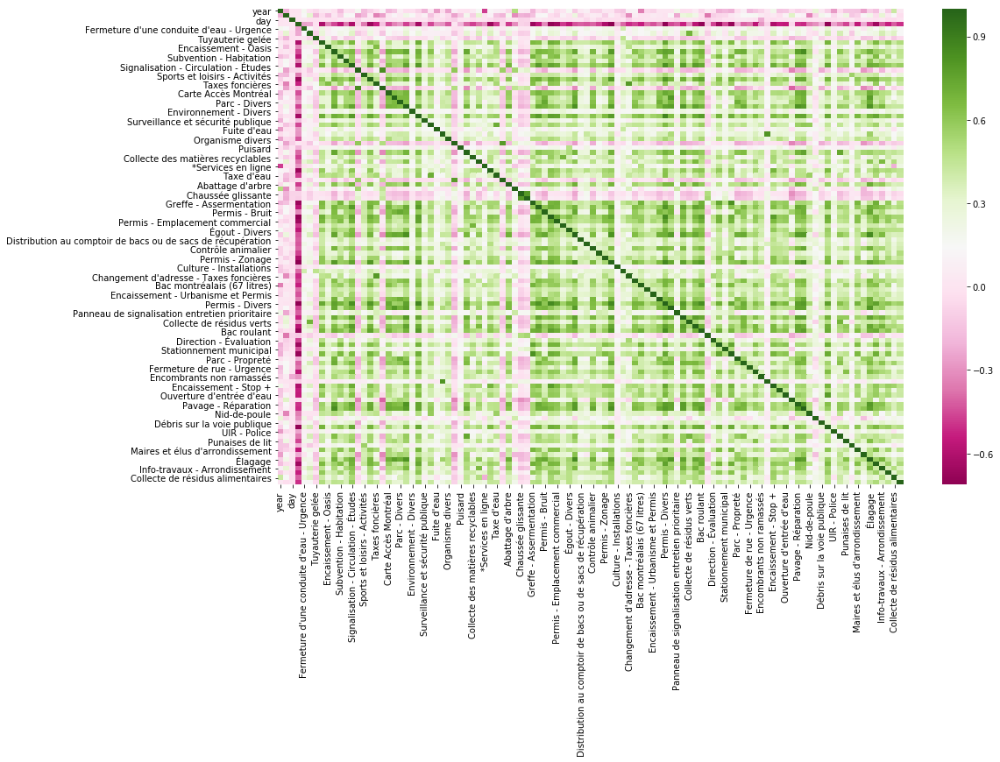

In [131]:
sns.heatmap(dataCountdayCorr,cmap="PiYG")

As before, it's difficult to read. So what we will do is looking the biggest correlation for each important activity.

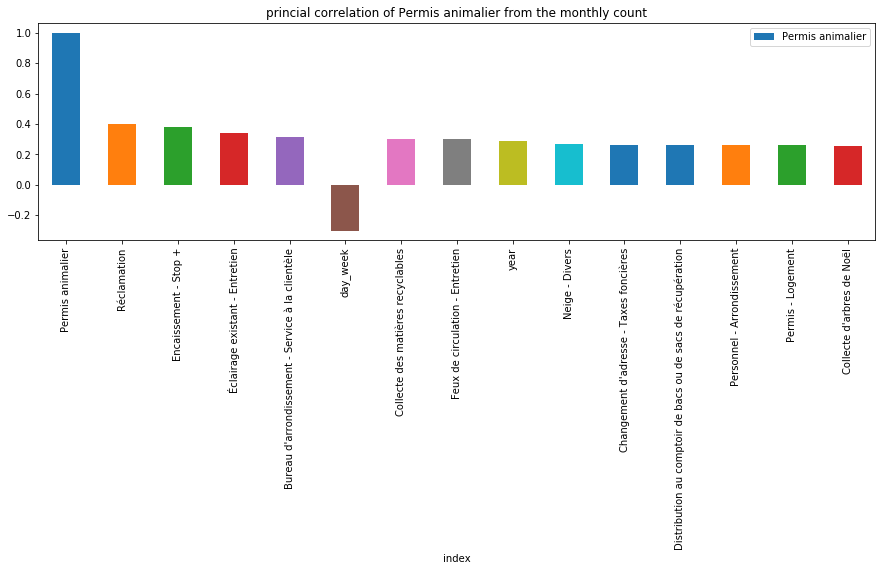

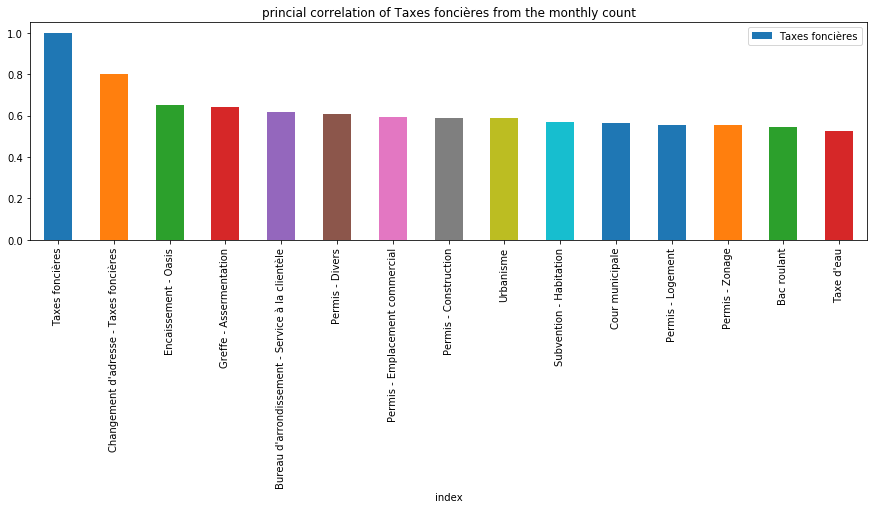

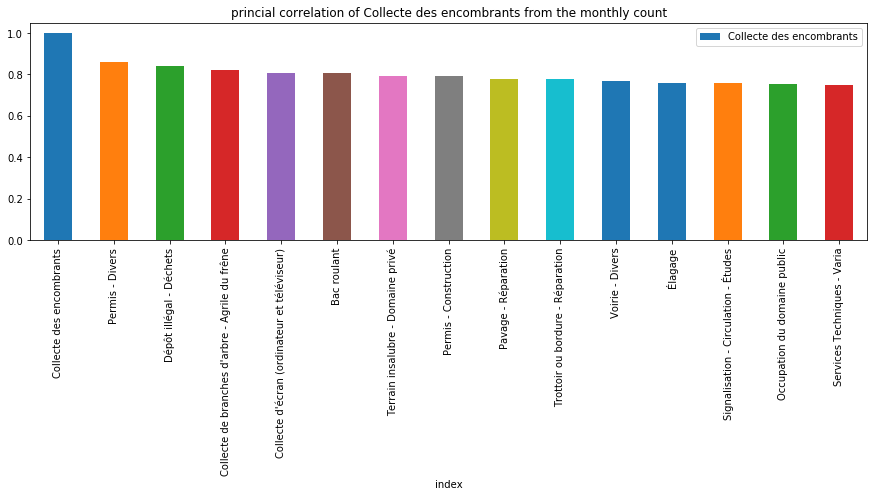

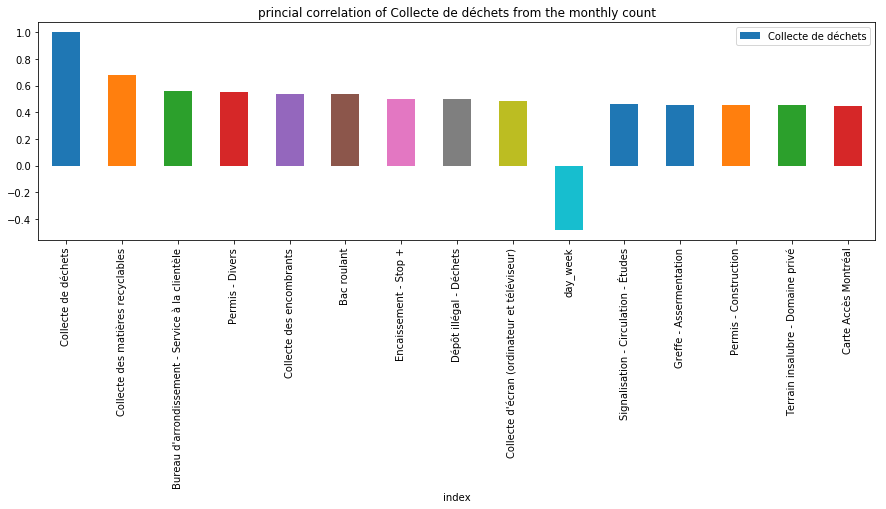

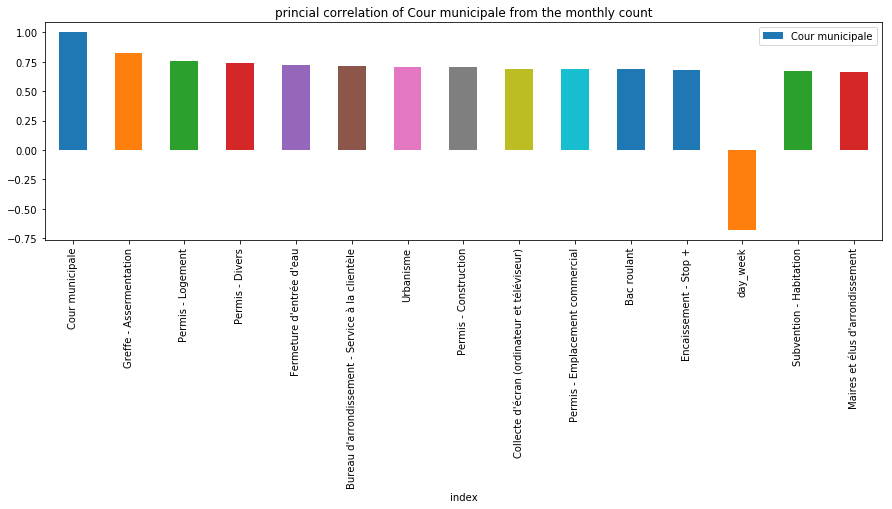

...

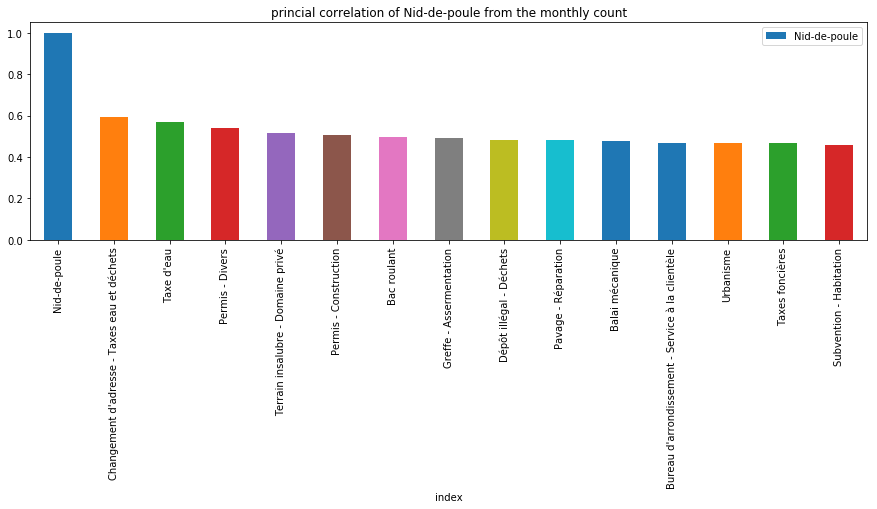

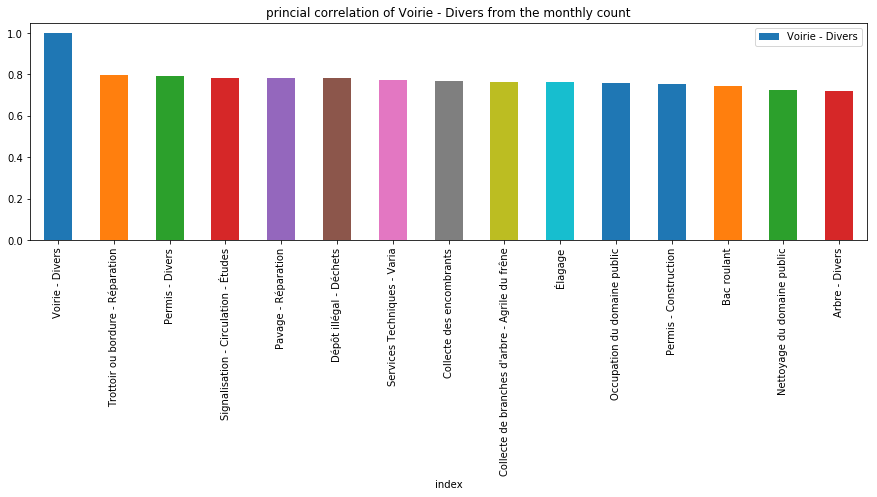

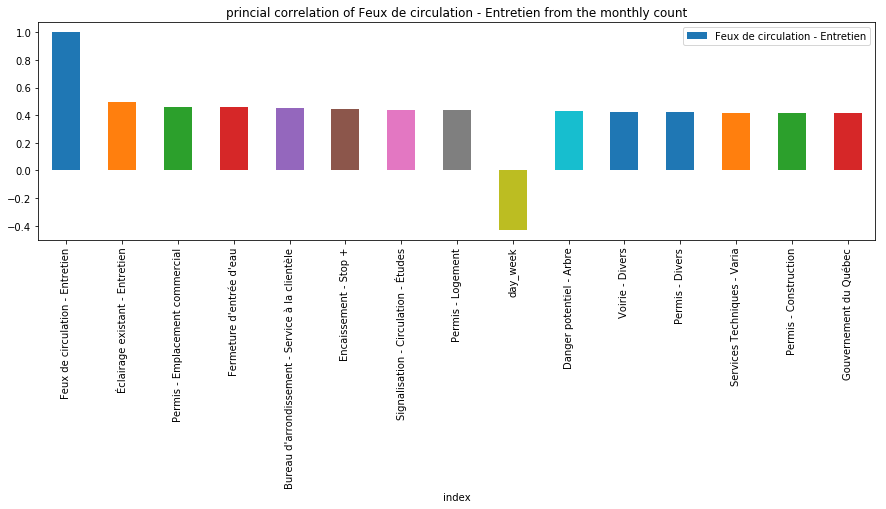

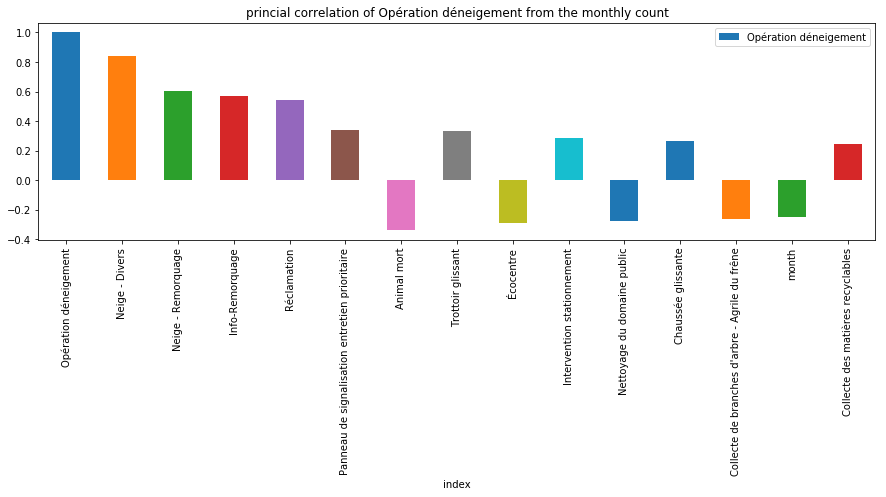

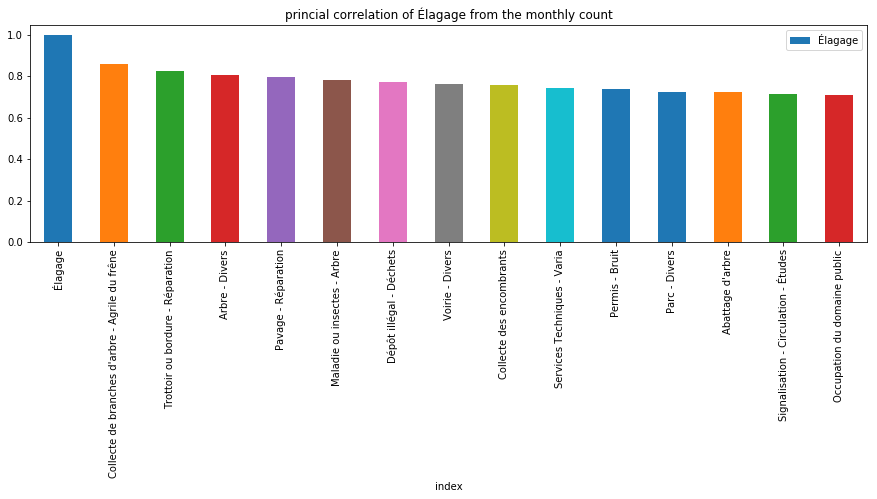

In [132]:
for NameVariable in Set_Acti_nom_Very_impo:

    # we want to sort this in function of the absolute value of the correlation, because negative correlation would still give us important information
    
    # we first create a new column that consist of the absolution value of the correlation for the data frame of correlation
    dataCountdayCorr['sort'] = dataCountdayCorr[NameVariable].abs()
   
    # sort the value in function of the absolution value of the correlation
    finalDf =dataCountdayCorr.sort_values('sort',ascending=False)
    # remove the sort column we used to calulate the absolute value of the correlation
    finalDf = finalDf.drop('sort', axis=1)
    
    # reset the index so that the index column can be used to have the variable the correlation are linked to
    finalDf=finalDf.reset_index()
    
    # we keep index(which is the name of the variable corrolated to NameVariable)
    # the NameVariable column is the value of the correlation
    # we keep only the 15 more important correlation
    finalDf=finalDf[['index',NameVariable]][:15]
    
    (finalDf.plot(x='index',y=NameVariable, kind='bar',figsize=(15, 4)).set_title('princial correlation of '+ NameVariable + ' from the monthly count'))
    plt.show()

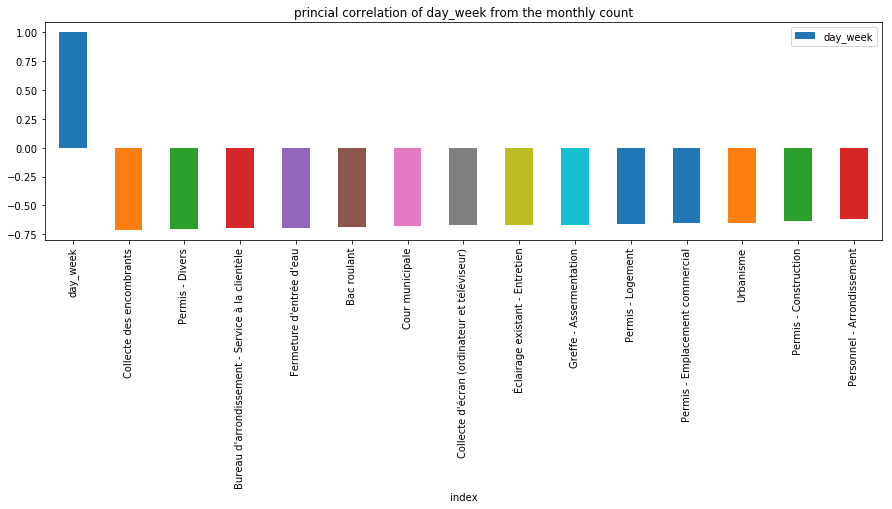

In [134]:
# now let us look for the weekday since that something that could give some insight
NameVariable = 'day_week'

# we want to sort this in function of the absolute value of the correlation, because negative correlation would still give us important information
    
# we first create a new column that consist of the absolution value of the correlation for the data frame of correlation
dataCountdayCorr['sort'] = dataCountdayCorr[NameVariable].abs()
   
# sort the value in function of the absolution value of the correlation
finalDf =dataCountdayCorr.sort_values('sort',ascending=False)
# remove the sort column we used to calulate the absolute value of the correlation
finalDf = finalDf.drop('sort', axis=1)
    
# reset the index so that the index column can be used to have the variable the correlation are linked to
finalDf=finalDf.reset_index()
    
# we keep index(which is the name of the variable corrolated to NameVariable)
# the NameVariable column is the value of the correlation
# we keep only the 15 more important correlation
finalDf=finalDf[['index',NameVariable]][:15]
    
(finalDf.plot(x='index',y=NameVariable, kind='bar',figsize=(15, 4)).set_title('princial correlation of '+ NameVariable + ' from the monthly count'))
plt.show()

Since the day of the week that the week-end are the biggest one, we kind of expect to have less of these during the week-end(or more late in the week.)

We can do the same thing for the month.

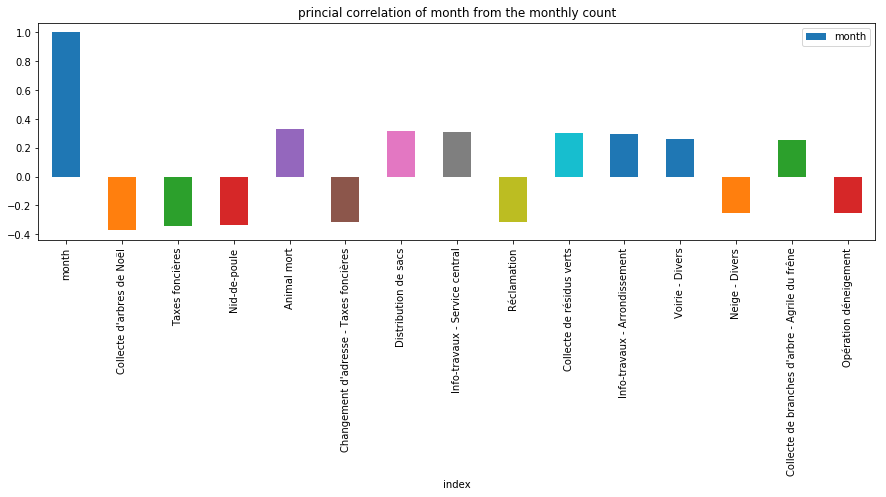

In [144]:
# now let us look for the weekday since that something that could give some insight
NameVariable = 'month'

# we want to sort this in function of the absolute value of the correlation, because negative correlation would still give us important information
    
# we first create a new column that consist of the absolution value of the correlation for the data frame of correlation
dataCountdayCorr['sort'] = dataCountdayCorr[NameVariable].abs()
   
# sort the value in function of the absolution value of the correlation
finalDf =dataCountdayCorr.sort_values('sort',ascending=False)
# remove the sort column we used to calulate the absolute value of the correlation
finalDf = finalDf.drop('sort', axis=1)
    
# reset the index so that the index column can be used to have the variable the correlation are linked to
finalDf=finalDf.reset_index()
    
# we keep index(which is the name of the variable corrolated to NameVariable)
# the NameVariable column is the value of the correlation
# we keep only the 15 more important correlation
finalDf=finalDf[['index',NameVariable]][:15]
    
(finalDf.plot(x='index',y=NameVariable, kind='bar',figsize=(15, 4)).set_title('princial correlation of '+ NameVariable + ' from the monthly count'))
plt.show()

This is not perfect since as in the case of week day, here we have numeric value when you cannot always say if it's make sense. But we do see thing that seem to make sense, like "collecte d'arbre de Noel" or "Opération déneigement" or 'neige - Divers" to be negatively corrolated with the month. These are more stuff that happen guring winter(i.e. month with lower value of month. Thus is corrolated negatively with the value of the month.

#### density plot

we can also see the link between the activities by doing density plot of the count for each day to see if there are some pattern.

C:\Users\Jules\AppData\Local\conda\conda\envs\nb36gp\lib\site-packages\matplotlib\pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


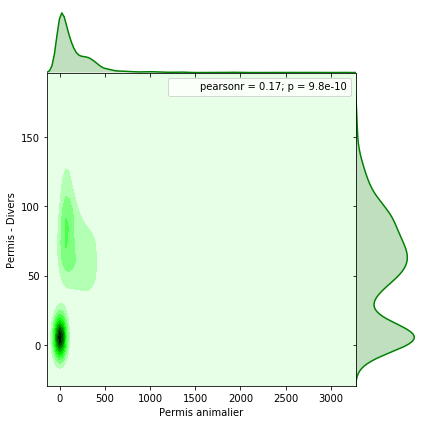

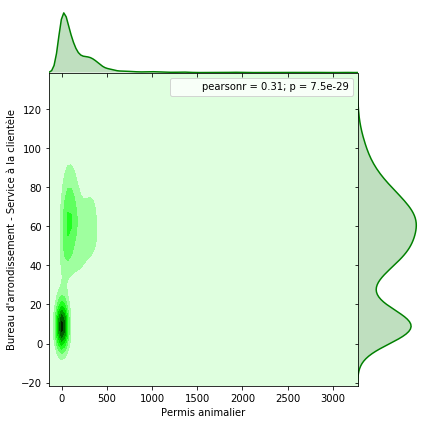

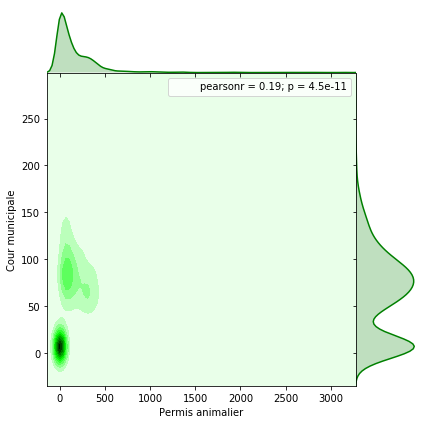

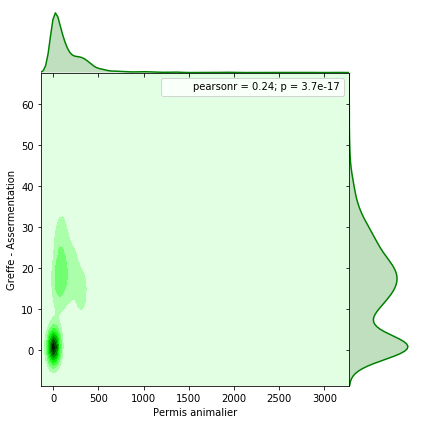

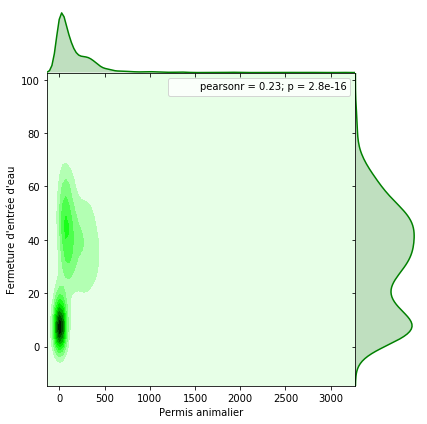

...

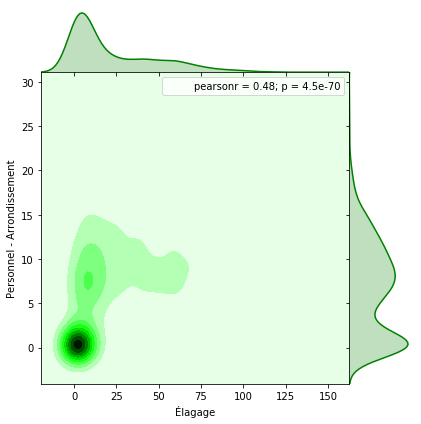

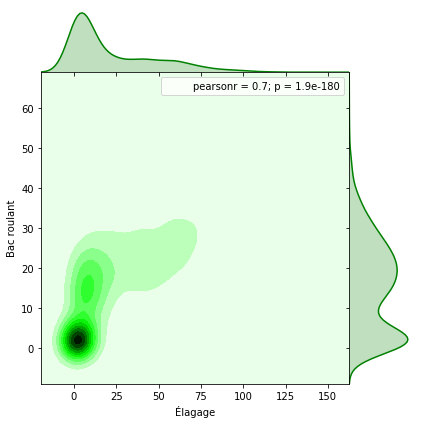

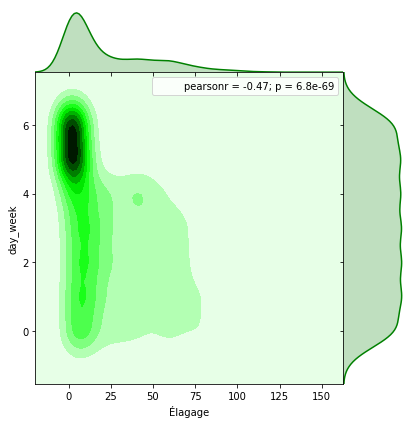

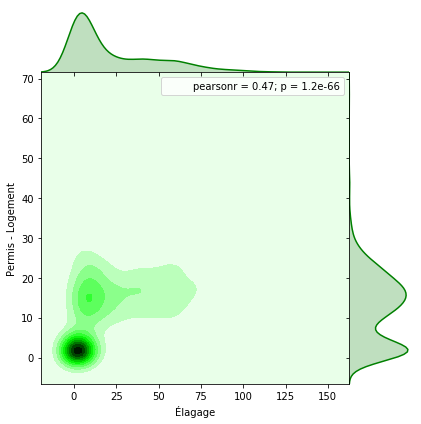

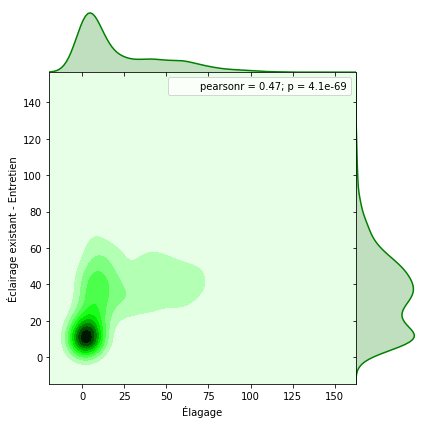

In [136]:
for NameA in Set_Acti_nom_Very_impo:
    
    
    # we want to sort this in function of the absolute value of the correlation, because negative correlation would still give us important information
    
    # we first create a new column that consist of the absolution value of the correlation for the data frame of correlation
    dataCountdayCorr['sort'] = dataCountdayCorr[NameVariable].abs()
   
    # sort the value in function of the absolution value of the correlation
    finalDf =dataCountdayCorr.sort_values('sort',ascending=False)
    # remove the sort column we used to calulate the absolute value of the correlation
    finalDf = finalDf.drop('sort', axis=1)
    
    # reset the index so that the index column can be used to have the variable the correlation are linked to
    finalDf=finalDf.reset_index()
    
    # we keep index(which is the name of the variable corrolated to NameVariable)
    # the NameVariable column is the value of the correlation
    # we keep only the 15 more important correlation
    finalDf=finalDf[['index',NameVariable]][:15]
    

    for name2 in set(finalDf['index']):

        if (name2!=NameA):

            (sns.jointplot(NameA, name2, data=dataCountday, kind="kde", space=0, color="g"))


Let us try to do with a small number of acivities so that we can show in one graph

In [141]:
# let make a copy of the data count data frame
dataCountdayGraph=dataCountday[:]

#let us keep the 4 most important activities
List_Acti_nom_4=list(dfCount.reset_index()['ACTI_NOM'][:4])

#just keep these activities in the data frame
dataCountdayGraph=dataCountdayGraph[List_Acti_nom_4]

#let show this data frame
dataCountdayGraph.head()

,Permis animalier,Taxes foncières,Collecte des encombrants,Collecte de déchets
0,0.0,5.0,5,57
1,7.0,49.0,56,201
2,254.0,102.0,73,220
3,3.0,7.0,18,46
4,3.0,6.0,21,7


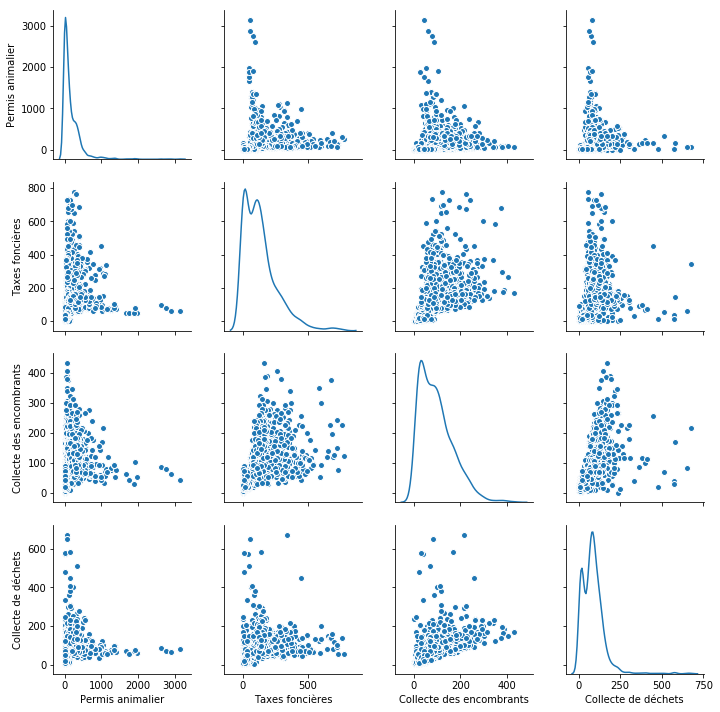

In [142]:
# we can see this data frame as
sns.pairplot(dataCountdayGraph, diag_kind="kde")

C:\Users\Jules\AppData\Local\conda\conda\envs\nb36gp\lib\site-packages\matplotlib\contour.py:967: UserWarning: The following kwargs were not used by contour: 'label', 'color'
  s)


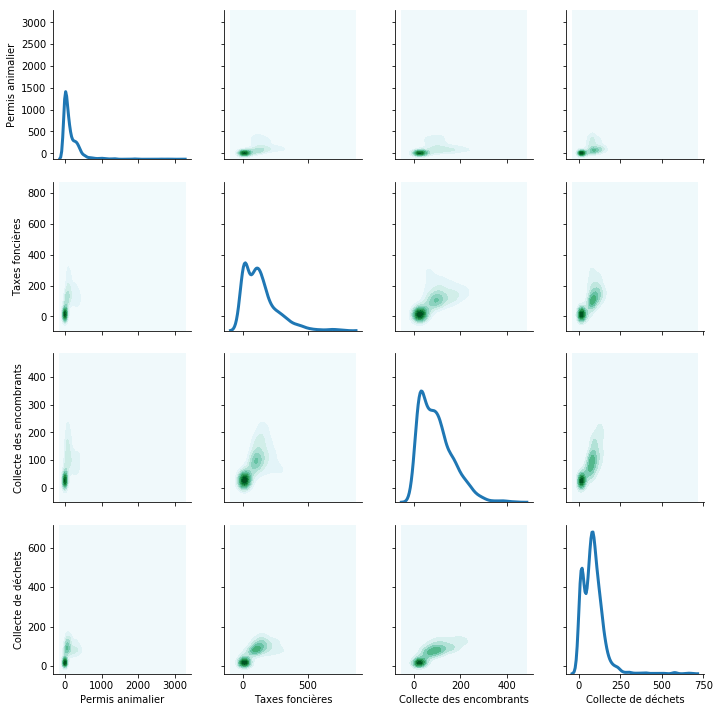

In [143]:
# or we can show as
g = sns.PairGrid(dataCountdayGraph)
g = g.map_upper(sns.kdeplot, shade=True)
g = g.map_lower(sns.kdeplot, shade=True)
g = g.map_diag(sns.kdeplot, lw=3, legend=False)



### Provenance of the "call"

We can also explore the origin of the call and what kind of way the the citizen communicate with the city. 

In [148]:
Set_prov= set(data['PROVENANCE_ORIGINALE'].dropna())
Set_prov

{'Courriel', 'Courrier', 'Instance', 'Personne', 'Télécopieur', 'Téléphone'}

In [149]:
dataCountprov=pd.DataFrame()
for Name_id in Set_prov:
    dataTest=0
    dataTest=pd.DataFrame()
    dataTest = data[(data['PROVENANCE_ORIGINALE']==Name_id) ].groupby(['year','month','day','day_week']).count()
    #print(dataTest)
    dataCountprov[Name_id]=dataTest['NATURE']

In [150]:
dataCountprov=dataCountprov.reset_index()
dataCountprov=dataCountprov.fillna(0)

In [152]:
dataCountprov.head()

,year,month,day,day_week,Courrier,Téléphone,Courriel,Instance,Télécopieur,Personne
0,2014,1,6,0,11,3491,65.0,2.0,0.0,630
1,2014,1,7,1,25,2928,69.0,1.0,9.0,407
2,2014,1,8,2,51,2729,83.0,15.0,20.0,527
3,2014,1,9,3,33,2561,95.0,0.0,3.0,585
4,2014,1,10,4,29,2112,59.0,1.0,3.0,461


In [153]:
# let save it if we want to use it for another thing
dataCountprov.to_csv('dataCountprov.csv')

## Clustering

What we will do a cluster the days in fonction of the number of call for for each activities.

So to be more clear, the features we will use are the number of call per activities for a given day and we will cluster the days with k-mean. We will do three clustering to see if we obtain similarity between these three. So it's will be more about the details, than the general idea that we will got from these.

In [161]:
# Let us make a data frame of the 10 most commun activity 
Set_Acti_nom_K=list(dfCount.reset_index()['ACTI_NOM'][:10])
# transform into a numpy array
MatrixKMean=dataCountday[Set_Acti_nom_K].as_matrix()
# define the model and train the data
kmeans = KMeans(n_clusters=10, random_state=0,n_init=200).fit(MatrixKMean)
# put the label of the clustering into a array
KmeanLabel1 = kmeans.labels_

In [160]:
# let us try with a different number of activities and cluster
Set_Acti_nom_K=list(dfCount.reset_index()['ACTI_NOM'][:25])
MatrixKMean=dataCountday[Set_Acti_nom_K].as_matrix()
kmeans = KMeans(n_clusters=15, random_state=0,n_init=200).fit(MatrixKMean)
KmeanLabel2 = kmeans.labels_


Set_Acti_nom_K=list(dfCount.reset_index()['ACTI_NOM'][:75])
MatrixKMean=dataCountday[Set_Acti_nom_K].as_matrix()
kmeans = KMeans(n_clusters=25, random_state=0,n_init=200).fit(MatrixKMean)
KmeanLabel3 = kmeans.labels_


Now that we have done the cluster, we can ask ourself what are the cateristics of theses cluster. We will calculate the average value of the month weekday of each cluster. That way, we will be able to tell how thing cluster.

Text(0.5,1,'cluster mean value obtain from K-mean of count activity name with 10 cluster')

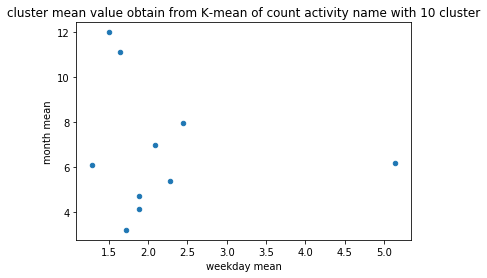

In [177]:
vT=[]
L=10 # number of cluster
for i in range(L):
    # create a dataframe that include only the one wich have the cluster indice equal to i
    # then only keep the month and the day of the week
    dfCluster = dataCountday[KmeanLabel1==i][['month','day_week']]
    # then calculate the mean and transform into a numpy array
    Values = dfCluster.mean().as_matrix()
    #put into a single numpy array
    v1=np.append([i],Values)
    # then put all the data into a single vector
    vT=np.concatenate((vT, v1), axis=0)

# resize the total vector so that we have 3 values per line
vT.resize(L, 3)

# put this data into a data frame
ClusterFrame1= pd.DataFrame(vT)
ClusterFrame1=ClusterFrame1.rename(columns={0: 'cluster', 1: 'month mean',2: 'weekday mean'})
#plot the data frame
ClusterFrame1.plot.scatter(y='month mean', x='weekday mean').set_title('cluster mean value obtain from K-mean of count activity name with 10 cluster')

we can do the same thing for the two other cluster we have

In [171]:
dataCountday[KmeanLabel1==0][['month','day_week']].mean().as_matrix()

array([6.1984127 , 5.14285714])

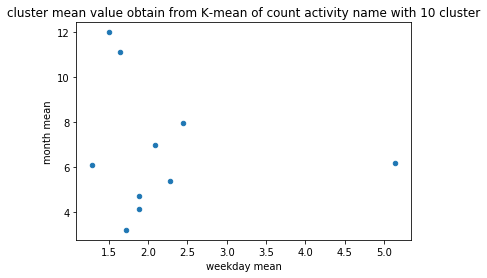

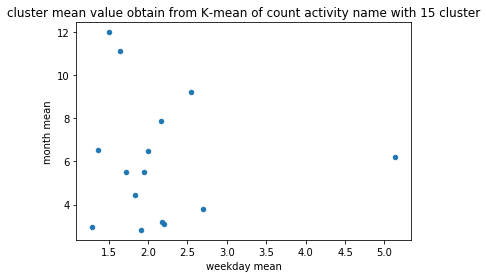

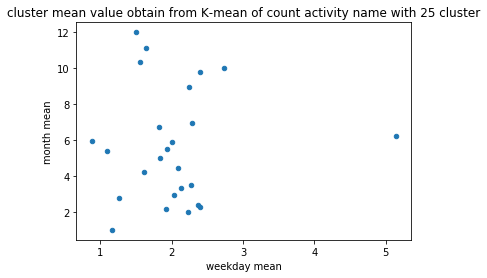

In [187]:
for j in range(3):
    if j ==0:
        KmeanLabel=KmeanLabel1
        L=10 # number of cluster
    elif j==1:
        KmeanLabel=KmeanLabel2
        L=15 # number of cluster
    elif j==2:
        KmeanLabel=KmeanLabel3
        L=25 # number of cluster

    vT=[]
 
    for i in range(L):
        # create a dataframe that include only the one wich have the cluster indice equal to i
        # then only keep the month and the day of the week
        dfCluster = dataCountday[KmeanLabel==i][['month','day_week']]
        # then calculate the mean and transform into a numpy array
        Values = dfCluster.mean().as_matrix()
        #put into a single numpy array
        v1=np.append([i],Values)
        # then put all the data into a single vector
        vT=np.concatenate((vT, v1), axis=0)

    # resize the total vector so that we have 3 values per line
    vT.resize(L, 3)

    # put this data into a data frame
    ClusterFrame1= pd.DataFrame(vT)
    ClusterFrame1=ClusterFrame1.rename(columns={0: 'cluster', 1: 'month mean',2: 'weekday mean'})
    #plot the data frame
    ClusterFrame1.plot.scatter(y='month mean', x='weekday mean').set_title('cluster mean value obtain from K-mean of count activity name with ' +str(L)+' cluster')
    plt.show()

As we can see most the cluster depend on the month. This mean that the cluster are mostly related by the season. This is kind of normal, this mean what create the most difference is not the day of the week, but when in the year, this happen. We also see a single point for the weekend, that seem to indicate that weekend behave differently. That could be that the number of call is higher or lower than during the day.